In [1]:
import numpy as np
import anndata as ad
import scanpy as sc
import pandas as pd
import decoupler as dc
import os
import pickle as pkl
import pydeseq2
from scipy import sparse
from scipy.stats import gaussian_kde
from statsmodels.stats.multitest import multipletests
import seaborn as sns, matplotlib.pyplot as plt
import gseapy as gp
from gseapy import dotplot
from gseapy import gseaplot
from scipy.stats import spearmanr
from statsmodels.stats.multitest import multipletests

from pydeseq2.dds import DeseqDataSet
from pydeseq2.default_inference import DefaultInference
from pydeseq2.ds import DeseqStats
import warnings

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# Load in data

adata = sc.read("/rds/general/user/ztb25/home/PBMC_datasets/concatenated_adata.h5ad")

In [3]:
adata

AnnData object with n_obs × n_vars = 880872 × 12711
    obs: 'age', 'gender', 'sample', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'celltypist_cell_label_coarse', 'celltypist_conf_score_coarse', 'celltypist_cell_label_fine', 'celltypist_conf_score_fine', 'dataset', 'sample_combined'
    var: 'feature_types', 'mt', 'gene_symbols', 'genome', 'gene_versions'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts', 'log1p_norm'

In [4]:
# Bringing back diagnosis column, needed for composition analysis, that got dropped at concatenation.

# the per-dataset files 
files = {
    "1": "/rds/general/user/ztb25/home/PBMC_datasets/1/PBMC1_clustering.h5ad",
    "4": "/rds/general/user/ztb25/home/PBMC_datasets/4/PBMC4_clustering.h5ad",
    "5": "/rds/general/user/ztb25/home/PBMC_datasets/5/PBMC5_clustering.h5ad",
    "6": "/rds/general/user/ztb25/home/PBMC_datasets/6/PBMC6_clustering.h5ad",
}

diag_map = {}
for ds, path in files.items():
    a = ad.read_h5ad(path, backed="r")
    integrated_barcodes = a.obs_names + f"-{ds}"
    if "diagnosis" in a.obs.columns:
        diags = a.obs["diagnosis"].astype(str).tolist()
    else:
        diags = ["CTRL"] * a.n_obs          # dataset 6 — no column, all controls
    diag_map.update(dict(zip(integrated_barcodes, diags)))
    a.file.close()

adata.obs["diagnosis"] = adata.obs_names.map(diag_map)

In [5]:
# standardise gender col

gender_map = {
    "M": "male", "F": "female",
    "Male": "male", "Female": "female",
    "male": "male", "female": "female",
}
adata.obs["gender"] = adata.obs["gender"].map(gender_map)

# make sure age is continous
adata.obs["age"] = pd.to_numeric(adata.obs["age"])


In [6]:
# set layer to raw counts

adata.X = adata.layers["counts"]

In [7]:
# Pseudobulk data (using decoupler)

pdata = dc.pp.pseudobulk(
    adata=adata,
    sample_col="sample_combined",
    groups_col="celltypist_cell_label_fine",
    mode="sum", 
)


In [8]:
pdata

AnnData object with n_obs × n_vars = 2472 × 12711
    obs: 'sample_combined', 'celltypist_cell_label_fine', 'age', 'gender', 'sample', 'dataset', 'diagnosis', 'psbulk_cells', 'psbulk_counts'
    var: 'feature_types', 'mt', 'gene_symbols', 'genome', 'gene_versions'
    layers: 'psbulk_props'

In [9]:
# exclude samples with low cell count (<30)
dc.pp.filter_samples(pdata, min_cells=30)

In [10]:
# Store raw counts in layers
pdata.layers["counts"] = pdata.X.copy()

# Normalize, scale and compute pca
sc.pp.normalize_total(pdata, target_sum=1e4)
sc.pp.log1p(pdata)
sc.pp.scale(pdata, max_value=10)
sc.tl.pca(pdata)

# Return raw counts to X
dc.pp.swap_layer(adata=pdata, key="counts", inplace=True)

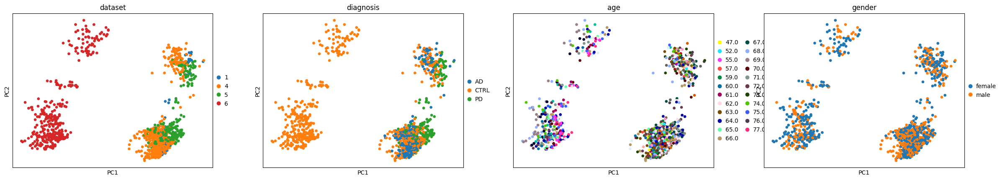

In [11]:
sc.pl.pca(pdata, color = ["dataset", "diagnosis", "age", "gender"])


In [12]:
# make age a continous variable in pdata
pdata.obs["age"] = pd.to_numeric(pdata.obs["age"])

# compute associations or correlations between each inferred PC and the variables in the metadata can be tested
dc.tl.rankby_obsm(pdata, key="X_pca", obs_keys = ["dataset", "diagnosis", "age", "gender"])

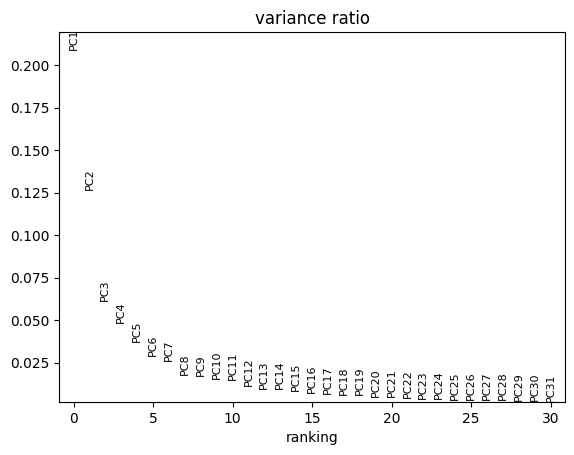

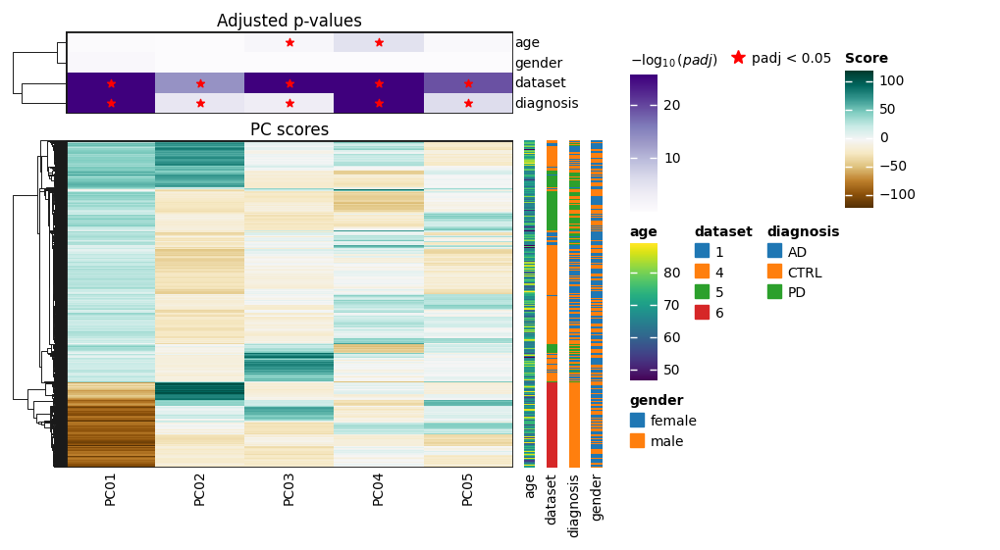

In [13]:
# visualise the importance of each principal component (based on its explained variance ratio) and its associations with metadata variables 
sc.pl.pca_variance_ratio(pdata)
dc.pl.obsm(adata=pdata, return_fig=True, nvar=5, titles=["PC scores", "Adjusted p-values"], figsize=(10, 5))

In [14]:
# Choose a cell type to compare

cell_type = "Classical monocytes"

mask = pdata.obs["celltypist_cell_label_fine"] == cell_type
pdata_ct = pdata[mask].copy()

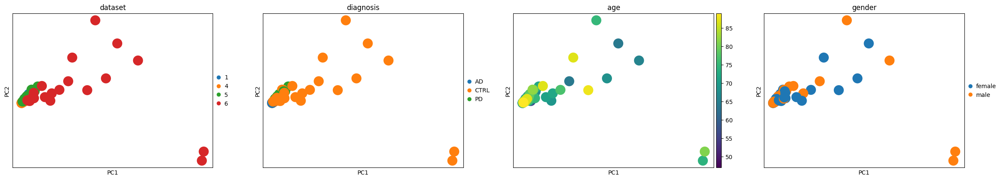

In [15]:
# cell-type specific PCA
sc.tl.pca(pdata_ct)
sc.pl.pca(pdata_ct, color = ["dataset", "diagnosis", "age", "gender"])

In [16]:
# split pdata into PD contrast and AD contrast

pdata_pd = pdata_ct[pdata_ct.obs["diagnosis"].isin(["CTRL", "PD"])].copy()
pdata_ad = pdata_ct[pdata_ct.obs["diagnosis"].isin(["CTRL", "AD"])].copy()

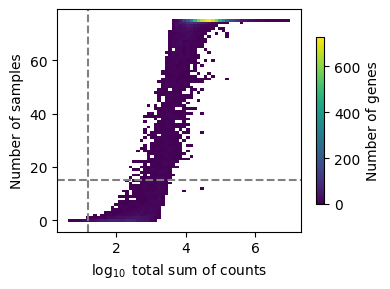

In [17]:
# filtering out genes with low expression

# for PD 
pdata_before_pd = pdata_pd.copy() # save a copy of the pdata before filtering, for later comparison

dc.pl.filter_by_expr(
    pdata_pd,
    group="diagnosis",      
)

dc.pp.filter_by_expr(
    pdata_pd,
    group="diagnosis",      # smallest group sets the min-samples rule)
)

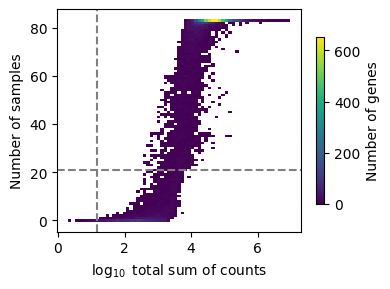

In [18]:
# for AD

pdata_before_ad = pdata_ad.copy() # save a copy of the pdata before filtering, for later comparison

dc.pl.filter_by_expr(
    pdata_ad,
    group="diagnosis",      
)

dc.pp.filter_by_expr(
    pdata_ad,
    group="diagnosis",      # smallest group sets the min-samples rule)
)



In [19]:
# create alternate visualization of gene expression distribution (log-CPM) and the filtering cutoff
def lcpm_from_adata(adata):
    X = adata.X.toarray() if sparse.issparse(adata.X) else np.asarray(adata.X)
    lib = X.sum(axis=1, keepdims=True)        # per-sample library size
    cpm = X / lib * 1e6
    return np.log2(cpm + 0.5)                  # samples x genes, log-CPM

def plot_density(lcpm, cutoff, title, ax):
    for i in range(lcpm.shape[0]):             # one curve per sample
        v = lcpm[i][np.isfinite(lcpm[i])]
        kde = gaussian_kde(v)
        xs = np.linspace(v.min(), v.max(), 200)
        ax.plot(xs, kde(xs), lw=1, alpha=0.7)
    ax.axvline(cutoff, ls=":", color="black")
    ax.set_title(title); ax.set_xlabel("log-CPM"); ax.set_ylabel("density")


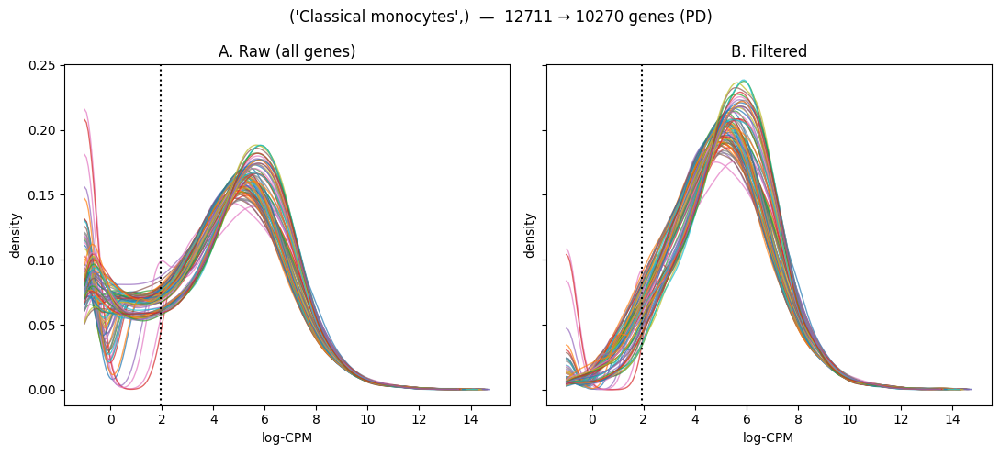

In [20]:
# cutoff line (limma vignette: log2(10/M + 2/L)) from the pre-filter libraries
lib = (pdata_before_pd.X.toarray() if sparse.issparse(pdata_before_pd.X) else np.asarray(pdata_before_pd.X)).sum(axis=1)
cutoff = np.log2(10 / (np.median(lib)*1e-6) + 2 / (lib.mean()*1e-6))

# plot
fig, axes = plt.subplots(1, 2, figsize=(11, 5), sharey=True)
plot_density(lcpm_from_adata(pdata_before_pd), cutoff, "A. Raw (all genes)", axes[0])
plot_density(lcpm_from_adata(pdata_pd),  cutoff, "B. Filtered",        axes[1])
plt.suptitle(f"{pdata_before_pd.obs['celltypist_cell_label_fine'].iloc[0], }  —  {pdata_before_pd.n_vars} → {pdata_pd.n_vars} genes (PD)")
plt.tight_layout()
plt.show()

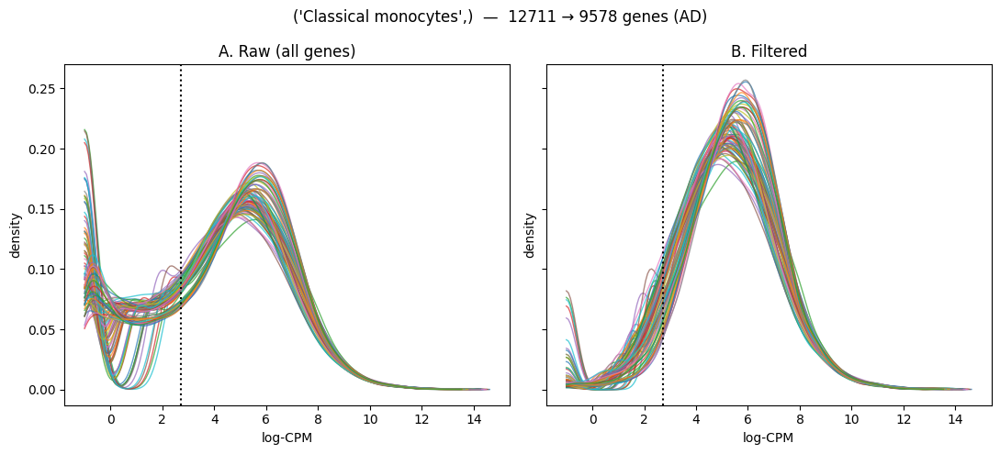

In [21]:
# same plot for AD
lib = (pdata_before_ad.X.toarray() if sparse.issparse(pdata_before_ad.X) else np.asarray(pdata_before_ad.X)).sum(axis=1)
cutoff = np.log2(10 / (np.median(lib)*1e-6) + 2 / (lib.mean()*1e-6))

# plot
fig, axes = plt.subplots(1, 2, figsize=(11, 5), sharey=True)
plot_density(lcpm_from_adata(pdata_before_ad), cutoff, "A. Raw (all genes)", axes[0])
plot_density(lcpm_from_adata(pdata_ad),  cutoff, "B. Filtered",        axes[1])
plt.suptitle(f"{pdata_before_ad.obs['celltypist_cell_label_fine'].iloc[0], }  —  {pdata_before_ad.n_vars} → {pdata_ad.n_vars} genes (AD)")
plt.tight_layout()
plt.show()

In [22]:
#### pyDESEQ2 ######

# extract required dataframes from anndata

# PD 
counts_df = pd.DataFrame(
    pdata_pd.X,  
    columns=pdata_pd.var_names,
    index=pdata_pd.obs["sample_combined"],
)
metadata = pdata_pd.obs[["dataset", "diagnosis", "age", "gender"]].copy()
metadata.index = counts_df.index  
metadata["diagnosis"] = pd.Categorical(
    metadata["diagnosis"],
    categories=["CTRL", "PD"],  # CTRL first = reference
)

metadata.head()

,dataset,diagnosis,age,gender
sample_combined,,,,
1_1,1,CTRL,67.0,female
1_2,1,CTRL,73.0,female
1_3,1,PD,66.0,female
1_4,1,PD,66.0,female
1_5,1,PD,78.0,female


In [23]:
# AD
counts_df_ad = pd.DataFrame(
    pdata_ad.X,  
    columns=pdata_ad.var_names,
    index=pdata_ad.obs["sample_combined"],
)
metadata_ad = pdata_ad.obs[["dataset", "diagnosis", "age", "gender"]].copy()
metadata_ad.index = counts_df_ad.index  
metadata_ad["diagnosis"] = pd.Categorical(
    metadata_ad["diagnosis"],
    categories=["CTRL", "AD"],  # CTRL first = reference
)

metadata_ad.head()

,dataset,diagnosis,age,gender
sample_combined,,,,
1_1,1,CTRL,67.0,female
1_2,1,CTRL,73.0,female
4_1,4,CTRL,66.0,male
4_10,4,AD,74.0,female
4_11,4,AD,66.0,male


In [24]:
# create DESeqDataSet objects

inference = DefaultInference(n_cpus=8)

# Model 1 -- main: PD vs CTRL, all datasets, AD samples dropped
dds = DeseqDataSet(
    counts=counts_df,
    metadata=metadata,
    design="~diagnosis + dataset + age + gender",
    refit_cooks=True,
    inference=inference,
)

# Model 2 -- secondary: AD vs CTRL, all datasets CTRL, AD samples only,
dds_ad = DeseqDataSet(
    counts=counts_df_ad,
    metadata=metadata_ad,
    design="~diagnosis + dataset + age + gender",
    refit_cooks=True,
    inference=inference,
)


In [25]:
# run the DE analysis (fit the model, compute LFCs)

dds.deseq2()
dds_ad.deseq2()

print(dds)
print(dds_ad)


Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.05 seconds.



/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-pa

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X


Fitting dispersions...


... done in 1.87 seconds.

Fitting dispersion trend curve...


... done in 0.23 seconds.

Fitting MAP dispersions...


... done in 2.07 seconds.

Fitting LFCs...


/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X


/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X


... done in 1.11 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Fitting size factors...
... done in 0.05 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...


... done in 1.74 seconds.

Fitting dispersion trend curve...


... done in 0.22 seconds.

Fitting MAP dispersions...


... done in 1.81 seconds.

Fitting LFCs...


AnnData object with n_obs × n_vars = 75 × 10270
    obs: 'dataset', 'diagnosis', 'age', 'gender', 'size_factors', 'replaceable'
    var: '_normed_means', 'non_zero', '_MoM_dispersions', 'genewise_dispersions', '_genewise_converged', 'fitted_dispersions', 'MAP_dispersions', '_MAP_converged', 'dispersions', '_outlier_genes', '_LFC_converged', 'replaced', 'refitted', '_pvalue_cooks_outlier'
    uns: 'trend_coeffs', 'disp_function_type', '_squared_logres', 'prior_disp_var'
    obsm: 'design_matrix', '_mu_LFC', '_hat_diagonals'
    varm: 'LFC'
    layers: 'normed_counts', '_mu_hat', 'cooks'
AnnData object with n_obs × n_vars = 83 × 9578
    obs: 'dataset', 'diagnosis', 'age', 'gender', 'size_factors', 'replaceable'
    var: '_normed_means', 'non_zero', '_MoM_dispersions', 'genewise_dispersions', '_genewise_converged', 'fitted_dispersions', 'MAP_dispersions', '_MAP_converged', 'dispersions', '_outlier_genes', '_LFC_converged', 'replaced', 'refitted', '_pvalue_cooks_outlier'
    uns: 'trend_c

... done in 1.12 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 0 outlier genes.



In [26]:
# Extract results for each contrast

# PD vs CTRL contrast
ds1 = DeseqStats(dds, contrast=["diagnosis", "PD", "CTRL"], inference=inference)

# AD vs CTRL contrast
ds2 = DeseqStats(dds_ad, contrast=["diagnosis", "AD", "CTRL"], inference=inference)


In [27]:
# runs Wald test + multiple testing correction

ds1.summary()

ds2.summary()

Running Wald tests...


... done in 0.45 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L     160.682816       -0.142885  0.083538 -1.710421  0.087188  0.856960
KLHL17     21.260011       -0.197608  0.245916 -0.803561  0.421651  0.950851
PLEKHN1    10.097057       -0.134073  0.333081 -0.402524  0.687299  0.974795
HES4       23.541537        0.040193  0.497371  0.080810  0.935593  0.995822
ISG15     574.915675       -0.168318  0.291307 -0.577802  0.563398  0.962561
...              ...             ...       ...       ...       ...       ...
MT-ND4L  3569.176765       -0.151389  0.177149 -0.854587  0.392780  0.950637
MT-ND4   9898.372143       -0.072660  0.137212 -0.529550  0.596424  0.965264
MT-ND5   4188.445209       -0.148335  0.164924 -0.899409  0.368435  0.947615
MT-ND6   1085.397636       -0.429779  0.193745 -2.218271  0.026536  0.784559
MT-CYB   8950.638321       -0.077087  0.200200 -0.385048  0.700202  0.974795

[10270 rows x 6 

Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L     104.266365       -0.020111  0.081594 -0.246475  0.805315  0.964047
KLHL17     15.783751        0.017100  0.214934  0.079557  0.936589  0.989920
HES4       30.739955        1.027636  0.436982  2.351670  0.018689  0.419219
ISG15     312.316444       -0.058247  0.225821 -0.257936  0.796456  0.960613
AGRN       11.665392        0.487295  0.338766  1.438438  0.150310  0.690131
...              ...             ...       ...       ...       ...       ...
MT-ND4L  1921.260774       -0.181332  0.152128 -1.191972  0.233272  0.761344
MT-ND4   4965.501004       -0.193817  0.128112 -1.512870  0.130313  0.666027
MT-ND5   2294.988166       -0.295718  0.137821 -2.145668  0.031899  0.487486
MT-ND6    705.742414       -0.280481  0.147452 -1.902187  0.057147  0.546927
MT-CYB   4864.460353       -0.176122  0.162391 -1.084553  0.278120  0.782602

[9578 rows x 6 c

... done in 0.43 seconds.



In [28]:
# Extract results (turn into df)

results_PD = ds1.results_df
results_PD.head()

results_AD = ds2.results_df
results_AD.head()

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
NOC2L,104.266365,-0.020111,0.081594,-0.246475,0.805315,0.964047
KLHL17,15.783751,0.017100,0.214934,0.079557,0.936589,0.989920
HES4,30.739955,1.027636,0.436982,2.351670,0.018689,0.419219
ISG15,312.316444,-0.058247,0.225821,-0.257936,0.796456,0.960613
AGRN,11.665392,0.487295,0.338766,1.438438,0.150310,0.690131


In [29]:
# Filter significant genes (padj < 0.05 and abs(log2FC) > 0.5)

sig_PD = results_PD[
    (results_PD["padj"] < 0.05) &
    (results_PD["log2FoldChange"].abs() > 0.585)
].sort_values("padj")

print(f"{len(sig_PD)} significant genes for PD vs CTRL")
print(sig_PD.head(20))


sig_AD = results_AD[
    (results_AD["padj"] < 0.05) &
    (results_AD["log2FoldChange"].abs() > 0.585)
].sort_values("padj")

print(f"{len(sig_AD)} significant genes for AD vs CTRL")
print(sig_AD.head(20))

0 significant genes for PD vs CTRL
Empty DataFrame
Columns: [baseMean, log2FoldChange, lfcSE, stat, pvalue, padj]
Index: []
8 significant genes for AD vs CTRL
            baseMean  log2FoldChange     lfcSE      stat        pvalue  \
C15orf48  153.421943        2.617125  0.490254  5.338303  9.382033e-08   
IL4I1      35.664186        0.937835  0.199384  4.703665  2.555329e-06   
TPST1      17.122400        1.336530  0.305629  4.373044  1.225261e-05   
SEC24A     82.737647        0.639732  0.147381  4.340679  1.420433e-05   
HSPA5     448.965720        1.035955  0.246945  4.195077  2.727790e-05   
AP1S3      11.020898        1.057751  0.250511  4.222374  2.417421e-05   
SLC45A4    54.482798       -0.621735  0.147904 -4.203635  2.626626e-05   
PTX3       92.613476        1.457046  0.353880  4.117343  3.832649e-05   

              padj  
C15orf48  0.000899  
IL4I1     0.012237  
TPST1     0.034012  
SEC24A    0.034012  
HSPA5     0.037324  
AP1S3     0.037324  
SLC45A4   0.037324  
PTX3  

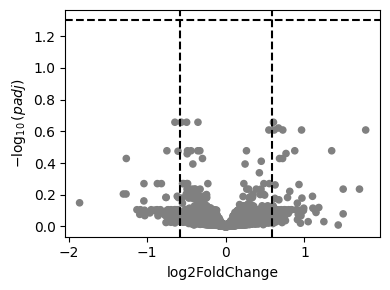

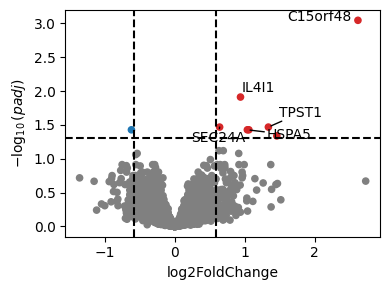

In [30]:
# visualise results via volcano plot 

dc.pl.volcano(results_PD, x="log2FoldChange", y="padj", thr_stat=0.585)

dc.pl.volcano(results_AD, x="log2FoldChange", y="padj", thr_stat=0.585)



Age-associated B cells


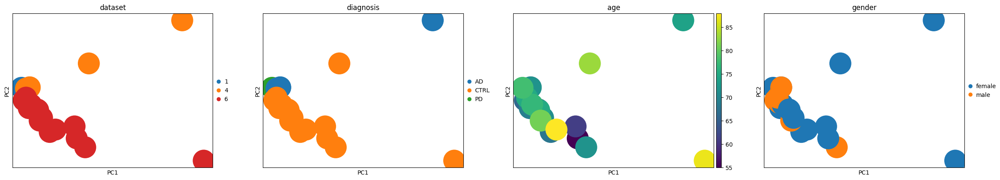

   skip PD: too few samples {'CTRL': np.int64(16), 'PD': np.int64(1)}
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 1.10 seconds.

Fitting dispersion trend curve...
... done in 0.17 seconds.

Fitting MAP dispersions...


... done in 1.08 seconds.

Fitting LFCs...


... done in 0.82 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.38 seconds.



Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
           baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L     22.618297       -0.372856  0.517181 -0.720938  0.470948  0.999995
ISG15     28.947632       -0.131997  0.689511 -0.191435  0.848185  0.999995
SDF4      49.596140       -0.012633  0.455169 -0.027755  0.977857  0.999995
B3GALT6   10.762597        0.771971  0.703829  1.096816  0.272722  0.999995
UBE2J2    22.562998        0.060353  0.444187  0.135872  0.891922  0.999995
...             ...             ...       ...       ...       ...       ...
MT-ND4L  360.941015       -0.015310  0.721160 -0.021230  0.983062  0.999995
MT-ND4   672.706057       -0.233918  0.428791 -0.545529  0.585389  0.999995
MT-ND5   301.094588       -0.040679  0.591747 -0.068743  0.945194  0.999995
MT-ND6   238.965050        0.244950  0.508501  0.481709  0.630013  0.999995
MT-CYB   583.263976       -0.467407  0.694810 -0.672712  0.501130  0.999995

[7800 rows x 6 columns]
   A

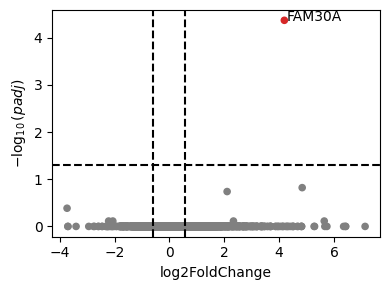

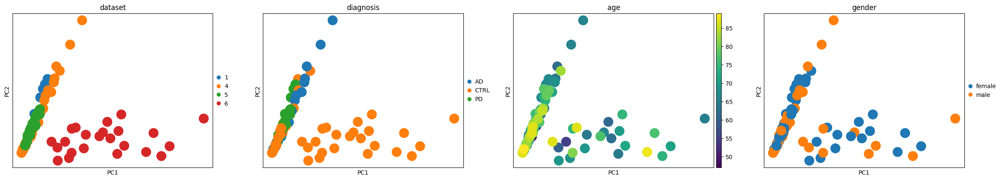

Fitting size factors...
... done in 0.04 seconds.

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + 

Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...


... done in 1.75 seconds.

Fitting dispersion trend curve...


... done in 0.21 seconds.

Fitting MAP dispersions...


... done in 1.94 seconds.

Fitting LFCs...
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ 

... done in 1.05 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.49 seconds.



Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       190.465660        0.073960  0.076994  0.960597  0.336755  0.875079
KLHL17       24.674812       -0.559831  0.298036 -1.878401  0.060326  0.733461
HES4         17.182923       -0.260016  0.493472 -0.526911  0.598255  0.946101
ISG15       351.306060        0.319169  0.183252  1.741700  0.081561  0.751702
C1orf159     35.311438       -0.223364  0.186689 -1.196447  0.231522  0.833338
...                ...             ...       ...       ...       ...       ...
MT-ND4L    5748.097101       -0.015330  0.169974 -0.090189  0.928137  0.992378
MT-ND4     5475.567611       -0.001966  0.145071 -0.013552  0.989188  0.998377
MT-ND5     4603.094134       -0.016631  0.157204 -0.105795  0.915745  0.991443
MT-ND6     1722.385648       -0.230688  0.144058 -1.601351  0.109299  0.775856
MT-CYB    10332.902825        0.069077  0.202817  0.340586  0.733415  0.

Fitting size factors...
... done in 0.05 seconds.

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + 

Fitting dispersions...


... done in 1.75 seconds.

Fitting dispersion trend curve...


... done in 0.23 seconds.

Fitting MAP dispersions...


... done in 1.79 seconds.

Fitting LFCs...
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ 

... done in 1.17 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.51 seconds.



Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      174.935446       -0.047733  0.063769 -0.748536  0.454137  0.910594
KLHL17      29.893027       -0.091461  0.145106 -0.630304  0.528496  0.925826
HES4        31.473446        0.992346  0.423698  2.342109  0.019175  0.622564
ISG15      321.353843       -0.030325  0.125190 -0.242230  0.808602  0.973581
C1orf159    37.686604       -0.237677  0.126280 -1.882135  0.059818  0.725761
...               ...             ...       ...       ...       ...       ...
MT-ND4L   4891.351492       -0.173111  0.141363 -1.224583  0.220732  0.821820
MT-ND4    4220.349785       -0.214079  0.120048 -1.783284  0.074540  0.743216
MT-ND5    4025.888105       -0.224806  0.132409 -1.697813  0.089543  0.762406
MT-ND6    1710.898681       -0.138942  0.120635 -1.151755  0.249422  0.828239
MT-CYB    9066.532019       -0.218313  0.157028 -1.390279  0.164444  0.819794

[986

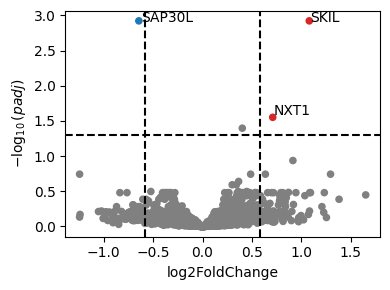

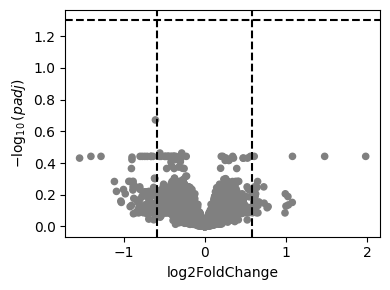

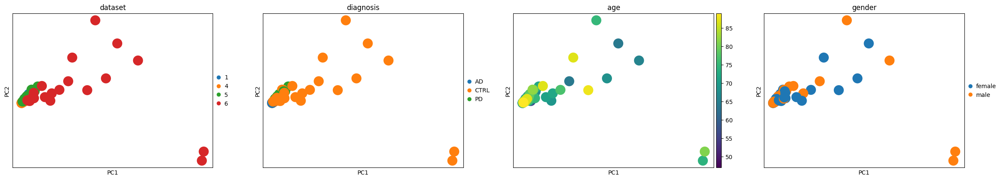

Fitting size factors...
... done in 0.04 seconds.



Using None as control genes, passed at DeseqDataSet initialization


/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
/rds/general/user/ztb25/home/miniforge3/e

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
/rds/general/user/ztb25/home/miniforge3/e

Fitting dispersions...


... done in 1.89 seconds.

Fitting dispersion trend curve...


... done in 0.22 seconds.

Fitting MAP dispersions...


... done in 1.98 seconds.

Fitting LFCs...


/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X


... done in 1.26 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.46 seconds.

Fitting size factors...


Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L     160.682816       -0.142885  0.083538 -1.710421  0.087188  0.856960
KLHL17     21.260011       -0.197608  0.245916 -0.803561  0.421651  0.950851
PLEKHN1    10.097057       -0.134073  0.333081 -0.402524  0.687299  0.974795
HES4       23.541537        0.040193  0.497371  0.080810  0.935593  0.995822
ISG15     574.915675       -0.168318  0.291307 -0.577802  0.563398  0.962561
...              ...             ...       ...       ...       ...       ...
MT-ND4L  3569.176765       -0.151389  0.177149 -0.854587  0.392780  0.950637
MT-ND4   9898.372143       -0.072660  0.137212 -0.529550  0.596424  0.965264
MT-ND5   4188.445209       -0.148335  0.164924 -0.899409  0.368435  0.947615
MT-ND6   1085.397636       -0.429779  0.193745 -2.218271  0.026536  0.784559
MT-CYB   8950.638321       -0.077087  0.200200 -0.385048  0.700202  0.974795

[10270 rows x 6 

... done in 0.05 seconds.



Fitting dispersions...


... done in 1.87 seconds.

Fitting dispersion trend curve...


... done in 0.22 seconds.

Fitting MAP dispersions...


... done in 1.79 seconds.

Fitting LFCs...


... done in 1.02 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.45 seconds.



Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L     104.266365       -0.020111  0.081594 -0.246475  0.805315  0.964047
KLHL17     15.783751        0.017100  0.214934  0.079557  0.936589  0.989920
HES4       30.739955        1.027636  0.436982  2.351670  0.018689  0.419219
ISG15     312.316444       -0.058247  0.225821 -0.257936  0.796456  0.960613
AGRN       11.665392        0.487295  0.338766  1.438438  0.150310  0.690131
...              ...             ...       ...       ...       ...       ...
MT-ND4L  1921.260774       -0.181332  0.152128 -1.191972  0.233272  0.761344
MT-ND4   4965.501004       -0.193817  0.128112 -1.512870  0.130313  0.666027
MT-ND5   2294.988166       -0.295718  0.137821 -2.145668  0.031899  0.487486
MT-ND6    705.742414       -0.280481  0.147452 -1.902187  0.057147  0.546927
MT-CYB   4864.460353       -0.176122  0.162391 -1.084553  0.278120  0.782602

[9578 rows x 6 c


DC2


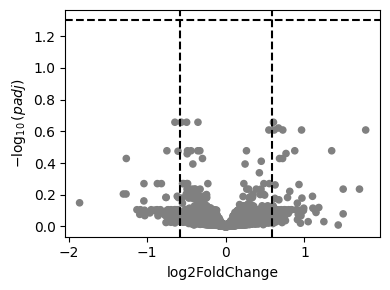

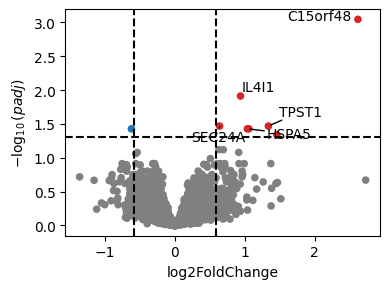

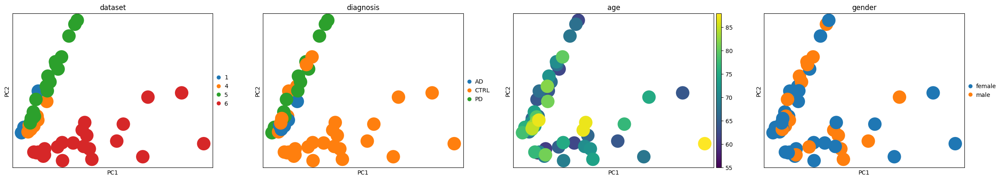

Fitting size factors...
... done in 0.03 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...


... done in 1.40 seconds.

Fitting dispersion trend curve...
... done in 0.19 seconds.

Fitting MAP dispersions...


... done in 1.43 seconds.

Fitting LFCs...


... done in 1.02 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.41 seconds.

Fitting size factors...
... done in 0.02 seconds.



Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      55.619647       -0.155169  0.146678 -1.057886  0.290108  0.998416
ISG15     108.849684       -0.103013  0.414905 -0.248281  0.803917  0.998416
SDF4      110.049519        0.081952  0.149474  0.548266  0.583509  0.998416
B3GALT6    12.854397       -0.481485  0.356491 -1.350624  0.176816  0.998416
UBE2J2     53.745625       -0.098854  0.155663 -0.635054  0.525393  0.998416
...              ...             ...       ...       ...       ...       ...
MT-ND4L  1293.645254       -0.086766  0.238335 -0.364052  0.715819  0.998416
MT-ND4   1731.687765       -0.102173  0.155359 -0.657658  0.510758  0.998416
MT-ND5   1014.933799       -0.056928  0.203467 -0.279787  0.779641  0.998416
MT-ND6    306.322304        0.055884  0.223196  0.250382  0.802292  0.998416
MT-CYB   2460.226673       -0.076234  0.254327 -0.299747  0.764370  0.998416

[8648 rows x 6 c

Fitting dispersions...


... done in 1.39 seconds.

Fitting dispersion trend curve...
... done in 0.18 seconds.

Fitting MAP dispersions...


... done in 1.39 seconds.

Fitting LFCs...


... done in 0.91 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.53 seconds.



Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      56.694923       -0.287054  0.194987 -1.472171  0.140975  0.862546
ISG15      92.910398       -0.558429  0.498736 -1.119688  0.262847  0.939815
AGRN        5.687051       -0.230265  0.889540 -0.258858  0.795745  0.995955
SDF4      118.825503        0.293503  0.182205  1.610842  0.107214  0.834435
B3GALT6    17.108698        0.318076  0.316776  1.004105  0.315328  0.961380
...              ...             ...       ...       ...       ...       ...
MT-ND4L   957.193329        0.159406  0.301137  0.529346  0.596565  0.995955
MT-ND4   1362.123299       -0.009090  0.199501 -0.045565  0.963657  0.997067
MT-ND5    813.762068        0.100946  0.265351  0.380424  0.703631  0.995955
MT-ND6    298.013687        0.343929  0.212248  1.620410  0.105144  0.829585
MT-CYB   1820.827548        0.096051  0.343329  0.279764  0.779658  0.995955

[8892 rows x 6 c

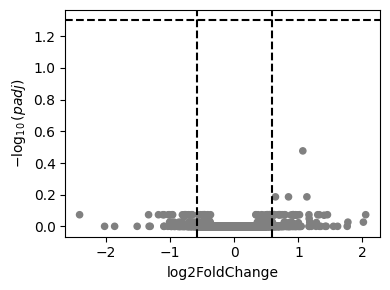

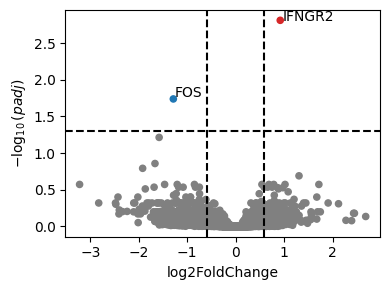

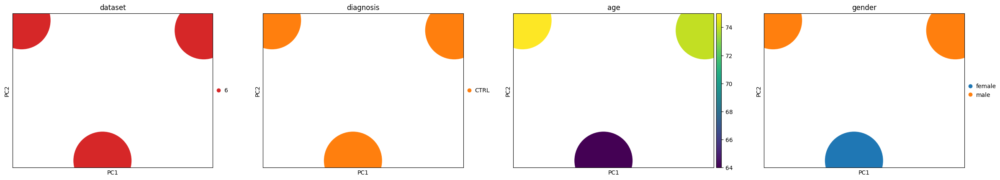

   skip PD: too few samples {'CTRL': np.int64(3)}
   skip AD: too few samples {'CTRL': np.int64(3)}

ILC3
   PCA skipped: n_components=0 must be between 1 and min(n_samples, n_features)=1 with svd_solver='arpack'
   skip PD: too few samples {'CTRL': np.int64(1)}
   skip AD: too few samples {'CTRL': np.int64(1)}

MAIT cells


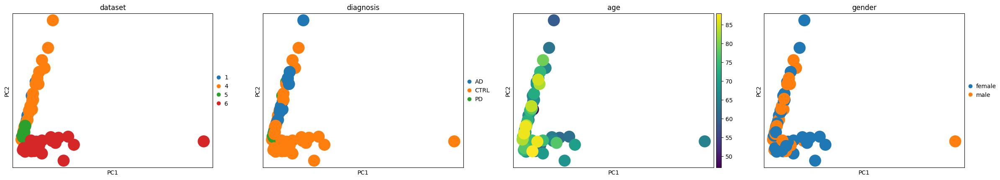

Fitting size factors...
... done in 0.02 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...


... done in 1.39 seconds.

Fitting dispersion trend curve...
... done in 0.16 seconds.

Fitting MAP dispersions...


... done in 1.21 seconds.

Fitting LFCs...


... done in 0.98 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.36 seconds.



Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       25.606059       -0.083414  0.238885 -0.349183  0.726952  0.978879
ISG15       52.182797        0.016347  0.294648  0.055479  0.955757  0.996330
TNFRSF18     9.380815        0.073546  0.500724  0.146879  0.883228  0.994479
TNFRSF4      7.103125       -0.506615  0.676237 -0.749168  0.453756  0.937631
SDF4        59.463402       -0.087568  0.230946 -0.379172  0.704560  0.978348
...               ...             ...       ...       ...       ...       ...
MT-ND4L    861.247259        0.021540  0.311879  0.069065  0.944938  0.996330
MT-ND4    1041.225606        0.050488  0.207893  0.242858  0.808115  0.988051
MT-ND5     685.204779        0.037580  0.253933  0.147991  0.882350  0.994479
MT-ND6     225.281481       -0.701162  0.227446 -3.082761  0.002051  0.356533
MT-CYB    1928.129360        0.041206  0.306856  0.134285  0.893177  0.994763

[792

Fitting size factors...
... done in 0.03 seconds.



Fitting dispersions...


... done in 1.33 seconds.

Fitting dispersion trend curve...
... done in 0.16 seconds.

Fitting MAP dispersions...


... done in 1.23 seconds.

Fitting LFCs...


... done in 0.81 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.37 seconds.



Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       28.203264        0.052494  0.131234  0.400001  0.689156  0.999065
ISG15       55.467375       -0.057106  0.185494 -0.307860  0.758189  0.999065
TNFRSF18    10.307604        0.296073  0.309611  0.956273  0.338934  0.999065
TNFRSF4      8.334716        0.024723  0.370808  0.066674  0.946841  0.999065
SDF4        67.027592       -0.082273  0.101371 -0.811597  0.417023  0.999065
...               ...             ...       ...       ...       ...       ...
MT-ND4L    929.440075       -0.183950  0.217686 -0.845023  0.398098  0.999065
MT-ND4     901.857591       -0.174774  0.156152 -1.119252  0.263033  0.999065
MT-ND5     708.731246       -0.218225  0.187871 -1.161570  0.245410  0.999065
MT-ND6     260.860602       -0.185923  0.152688 -1.217667  0.223350  0.999065
MT-CYB    2046.775998       -0.247829  0.203466 -1.218040  0.223209  0.999065

[764

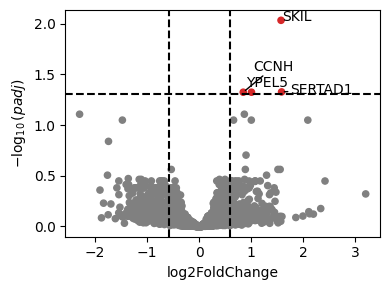

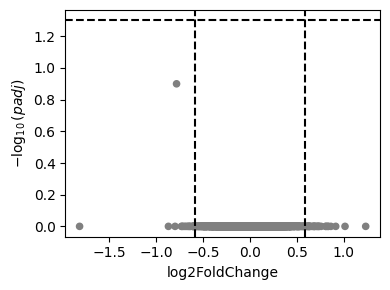

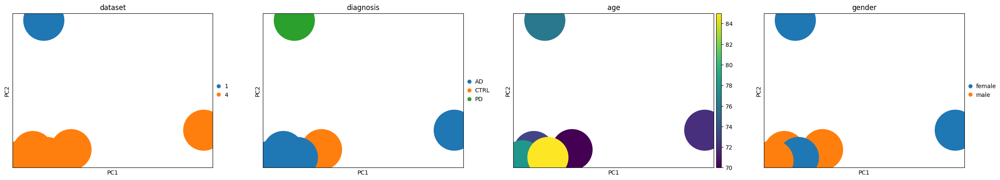

   skip PD: too few samples {'CTRL': np.int64(1), 'PD': np.int64(1)}
   skip AD: too few samples {'AD': np.int64(4), 'CTRL': np.int64(1)}

Memory B cells


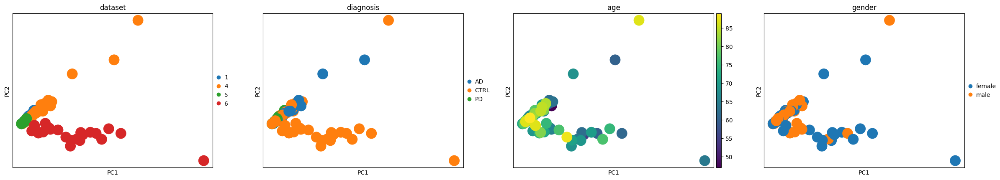

Fitting size factors...
... done in 0.03 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...


... done in 1.59 seconds.

Fitting dispersion trend curve...


... done in 0.21 seconds.

Fitting MAP dispersions...


... done in 1.50 seconds.

Fitting LFCs...


... done in 1.12 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.41 seconds.



Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       41.946561        0.059742  0.207692  0.287646  0.773617  0.999992
ISG15       57.356523        0.253374  0.324837  0.780003  0.435389  0.999992
C1orf159     7.020601       -1.023633  0.625902 -1.635451  0.101954  0.999992
TNFRSF18     6.370501        0.065780  0.660046  0.099660  0.920614  0.999992
SDF4        85.098345       -0.567399  0.201749 -2.812397  0.004917  0.999992
...               ...             ...       ...       ...       ...       ...
MT-ND4L   1457.402806        0.065206  0.287130  0.227097  0.820348  0.999992
MT-ND4    1810.641930        0.000540  0.192608  0.002805  0.997762  0.999992
MT-ND5     978.741471        0.206662  0.242783  0.851222  0.394646  0.999992
MT-ND6     420.740586       -0.196039  0.234199 -0.837059  0.402559  0.999992
MT-CYB    2800.556171        0.071280  0.277375  0.256979  0.797195  0.999992

[895

Fitting size factors...
... done in 0.04 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...


... done in 1.51 seconds.

Fitting dispersion trend curve...
... done in 0.19 seconds.

Fitting MAP dispersions...


... done in 1.53 seconds.

Fitting LFCs...


... done in 0.97 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.39 seconds.



Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       45.441399        0.022053  0.095737  0.230353  0.817817  0.994035
ISG15       58.141882        0.063972  0.157715  0.405621  0.685021  0.994035
TNFRSF18     8.726585        0.130880  0.262164  0.499229  0.617618  0.994035
SDF4        99.541166        0.102005  0.085940  1.186938  0.235252  0.978873
B3GALT6     20.411271        0.286874  0.137877  2.080655  0.037466  0.896606
...               ...             ...       ...       ...       ...       ...
MT-ND4L   1506.648597        0.005282  0.175879  0.030035  0.976040  0.996386
MT-ND4    1570.420156       -0.104195  0.124600 -0.836237  0.403022  0.988289
MT-ND5    1056.662694       -0.070421  0.145767 -0.483104  0.629022  0.994035
MT-ND6     489.843169       -0.150870  0.125353 -1.203562  0.228759  0.976037
MT-CYB    2907.886263       -0.092874  0.162886 -0.570178  0.568557  0.992436

[873

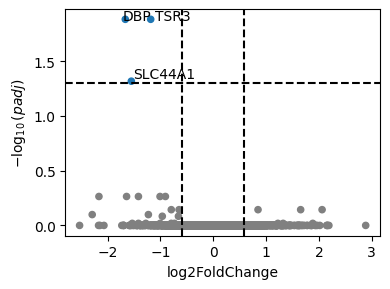

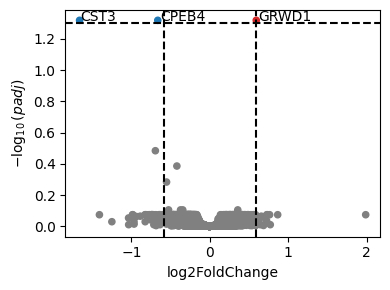

<Figure size 2911.2x480 with 0 Axes>

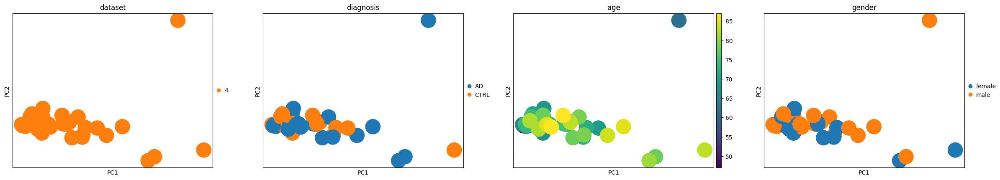

   skip PD: too few samples {'CTRL': np.int64(19)}
   dropping 'dataset' from AD design (single level here)
Using None as control genes, passed at DeseqDataSet initialization


Fitting size factors...
... done in 0.01 seconds.



Fitting dispersions...


... done in 0.60 seconds.

Fitting dispersion trend curve...
... done in 0.07 seconds.

Fitting MAP dispersions...


... done in 0.66 seconds.

Fitting LFCs...


... done in 0.41 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.22 seconds.



Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      13.480665       -0.025790  0.147178 -0.175233  0.860897  0.992884
ISG15      22.146933        0.081834  0.192277  0.425607  0.670395  0.992884
TNFRSF18   48.864279        0.331929  0.126210  2.629980  0.008539  0.992884
TNFRSF4    11.221309        0.339785  0.196474  1.729409  0.083736  0.992884
SDF4       42.782574        0.004792  0.099953  0.047947  0.961758  0.998602
...              ...             ...       ...       ...       ...       ...
MT-ND4L   359.046322       -0.123000  0.164141 -0.749354  0.453644  0.992884
MT-ND4    236.694122       -0.253415  0.134501 -1.884115  0.059549  0.992884
MT-ND5    284.919474       -0.199006  0.150383 -1.323326  0.185727  0.992884
MT-ND6    110.740019       -0.126420  0.151050 -0.836936  0.402628  0.992884
MT-CYB    682.899498       -0.187378  0.154639 -1.211714  0.225622  0.992884

[4021 rows x 6 c

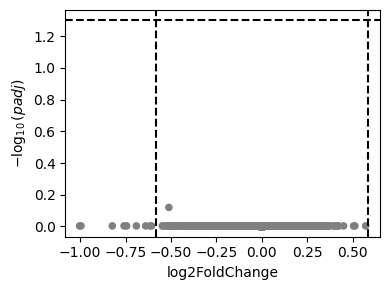

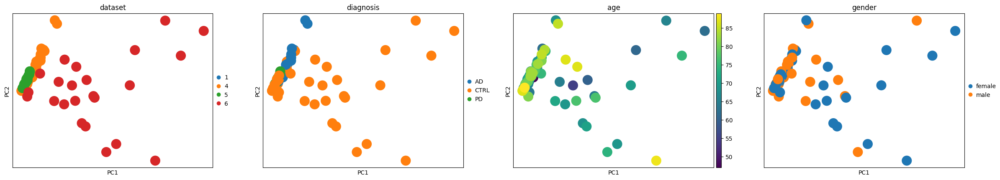

Fitting size factors...
... done in 0.03 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...


... done in 1.44 seconds.

Fitting dispersion trend curve...
... done in 0.18 seconds.

Fitting MAP dispersions...


... done in 1.38 seconds.

Fitting LFCs...


... done in 1.03 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.40 seconds.

Fitting size factors...
... done in 0.04 seconds.



Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      44.565421        0.081162  0.149719  0.542095  0.587753  0.987507
ISG15      40.266899        0.142327  0.258690  0.550184  0.582193  0.987507
SDF4       73.217262        0.002272  0.159604  0.014235  0.988642  0.998223
B3GALT6    12.462262       -0.023026  0.428198 -0.053774  0.957116  0.993616
UBE2J2     40.153888       -0.028134  0.149551 -0.188121  0.850781  0.987507
...              ...             ...       ...       ...       ...       ...
MT-ND4L  1870.264834       -0.036856  0.202465 -0.182038  0.855553  0.987507
MT-ND4   1864.674653        0.065472  0.142212  0.460383  0.645241  0.987507
MT-ND5   1236.532327       -0.049804  0.170113 -0.292768  0.769699  0.987507
MT-ND6    502.714360       -0.278901  0.156125 -1.786388  0.074037  0.950443
MT-CYB   3395.463043        0.091238  0.192864  0.473068  0.636164  0.987507

[8127 rows x 6 c

Fitting dispersions...


... done in 1.42 seconds.

Fitting dispersion trend curve...
... done in 0.18 seconds.

Fitting MAP dispersions...


... done in 1.38 seconds.

Fitting LFCs...


... done in 0.99 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.37 seconds.



Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      41.962039        0.085331  0.113442  0.752196  0.451933  0.840460
ISG15      32.966781       -0.196680  0.198020 -0.993234  0.320596  0.783883
SDF4       72.565798        0.069986  0.106608  0.656482  0.511514  0.868166
B3GALT6    17.053110        0.080792  0.143052  0.564774  0.572227  0.895748
UBE2J2     41.099005        0.020485  0.104386  0.196243  0.844420  0.970884
...              ...             ...       ...       ...       ...       ...
MT-ND4L  1637.042230       -0.053619  0.155354 -0.345142  0.729988  0.942521
MT-ND4   1490.794206       -0.076287  0.107717 -0.708221  0.478808  0.855047
MT-ND5   1136.129601       -0.124571  0.129113 -0.964825  0.334632  0.788805
MT-ND6    509.463060       -0.102682  0.115741 -0.887177  0.374984  0.803732
MT-CYB   3032.949072       -0.111042  0.144218 -0.769961  0.441323  0.836920

[7925 rows x 6 c


Non-classical monocytes


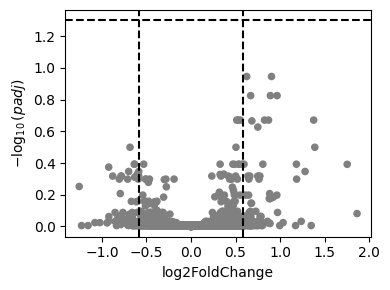

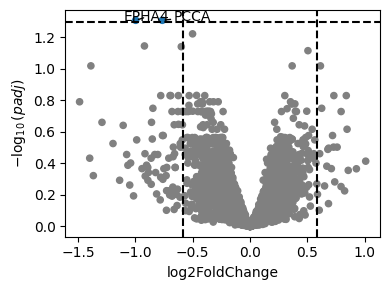

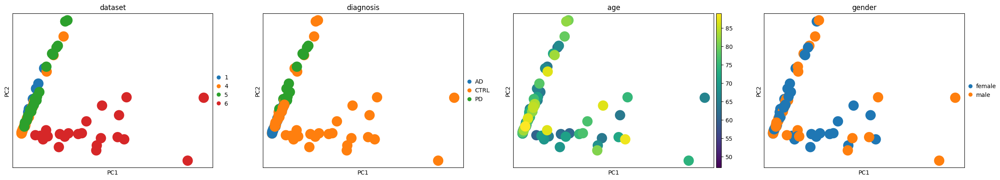

Fitting size factors...
... done in 0.04 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...


... done in 1.57 seconds.

Fitting dispersion trend curve...


... done in 0.23 seconds.

Fitting MAP dispersions...


... done in 1.62 seconds.

Fitting LFCs...


... done in 1.08 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.40 seconds.

Fitting size factors...


Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      109.472008       -0.127961  0.111941 -1.143120  0.252989  0.925669
KLHL17       9.097971        0.029852  0.380448  0.078464  0.937459  0.995971
HES4       279.283143       -0.063951  0.340520 -0.187803  0.851031  0.993313
ISG15      318.479019        0.117964  0.231002  0.510659  0.609590  0.975618
C1orf159    14.389749       -0.000834  0.233506 -0.003570  0.997151  0.999847
...               ...             ...       ...       ...       ...       ...
MT-ND4L   2112.161031       -0.071896  0.158146 -0.454614  0.649387  0.977266
MT-ND4    3502.031517       -0.014228  0.127839 -0.111300  0.911379  0.995549
MT-ND5    2095.390613       -0.113868  0.144193 -0.789692  0.429708  0.961450
MT-ND6     608.808129       -0.323554  0.181344 -1.784203  0.074391  0.867002
MT-CYB    4812.178255        0.004287  0.216891  0.019766  0.984230  0.999847

[910

... done in 0.04 seconds.



/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X


Fitting dispersions...


... done in 1.51 seconds.

Fitting dispersion trend curve...
... done in 0.19 seconds.

Fitting MAP dispersions...


... done in 1.50 seconds.

Fitting LFCs...


/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X


... done in 1.04 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.40 seconds.



Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       82.884709       -0.117428  0.112495 -1.043850  0.296555  0.974422
HES4       280.103375        0.146363  0.166804  0.877454  0.380240  0.985698
ISG15      182.690822        0.104543  0.193973  0.538957  0.589917  0.997613
C1orf159    11.848653        0.022055  0.213555  0.103277  0.917743  0.999729
SDF4       129.307367       -0.055524  0.095676 -0.580329  0.561693  0.997613
...               ...             ...       ...       ...       ...       ...
MT-ND4L   1312.969733       -0.198625  0.151902 -1.307587  0.191014  0.961940
MT-ND4    1866.160708       -0.203881  0.141042 -1.445530  0.148309  0.954553
MT-ND5    1290.309119       -0.167448  0.139416 -1.201066  0.229726  0.974422
MT-ND6     451.401734       -0.160975  0.138728 -1.160363  0.245901  0.974422
MT-CYB    3103.562758       -0.255629  0.181561 -1.407948  0.159147  0.954553

[860

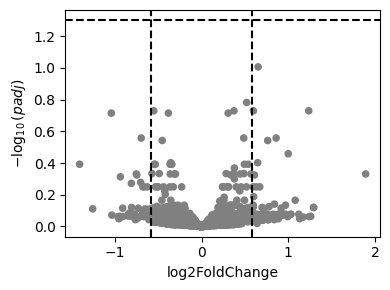

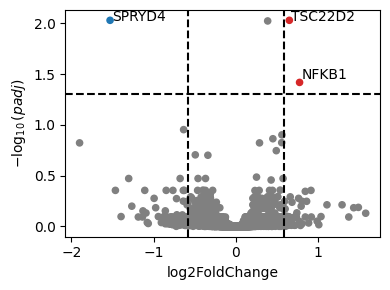

<Figure size 2911.2x480 with 0 Axes>

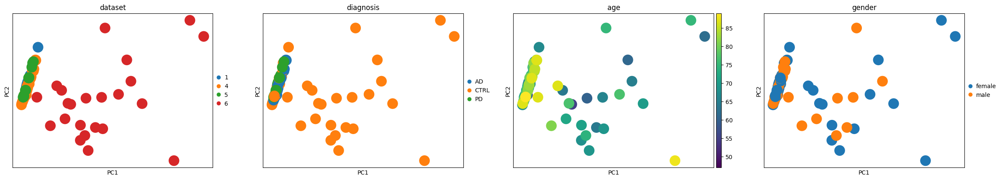

Fitting size factors...
... done in 0.03 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...


... done in 1.40 seconds.

Fitting dispersion trend curve...
... done in 0.16 seconds.

Fitting MAP dispersions...


... done in 1.21 seconds.

Fitting LFCs...


... done in 0.79 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.37 seconds.

Fitting size factors...


Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       35.887570        0.134848  0.205342  0.656702  0.511373  0.991270
ISG15      114.007795        0.417617  0.268547  1.555100  0.119922  0.965201
TNFRSF18    26.221805       -0.536055  0.292494 -1.832702  0.066847  0.931698
TNFRSF4     37.209727       -0.556337  0.275867 -2.016686  0.043728  0.931698
SDF4        84.321792       -0.290319  0.170983 -1.697943  0.089518  0.958707
...               ...             ...       ...       ...       ...       ...
MT-ND4L    803.128982       -0.059505  0.315904 -0.188366  0.850590  0.992640
MT-ND4     910.874867       -0.008244  0.191764 -0.042991  0.965709  0.997129
MT-ND5     618.187736        0.007425  0.245888  0.030196  0.975910  0.997371
MT-ND6     238.231176       -0.437056  0.193060 -2.263834  0.023584  0.896601
MT-CYB    1859.428594        0.013312  0.264808  0.050269  0.959908  0.996065

[738

... done in 0.03 seconds.



Fitting dispersions...


... done in 1.18 seconds.

Fitting dispersion trend curve...
... done in 0.14 seconds.

Fitting MAP dispersions...


... done in 1.07 seconds.

Fitting LFCs...


... done in 0.69 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.35 seconds.



Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       31.092269       -0.123923  0.132392 -0.936028  0.349259  0.998458
ISG15       86.602215        0.083930  0.152535  0.550237  0.582157  0.998458
TNFRSF18    24.265611       -0.100886  0.182529 -0.552710  0.580462  0.998458
TNFRSF4     37.386668        0.223378  0.172493  1.294998  0.195321  0.998458
SDF4        79.684816        0.192610  0.094401  2.040327  0.041318  0.998458
...               ...             ...       ...       ...       ...       ...
MT-ND4L    633.973481       -0.099666  0.181417 -0.549374  0.582748  0.998458
MT-ND4     612.427835       -0.121420  0.118288 -1.026470  0.304670  0.998458
MT-ND5     516.151841       -0.090154  0.146521 -0.615300  0.538357  0.998458
MT-ND6     227.366924       -0.043348  0.118628 -0.365409  0.714806  0.998458
MT-CYB    1465.121104       -0.139858  0.147331 -0.949277  0.342480  0.998458

[642

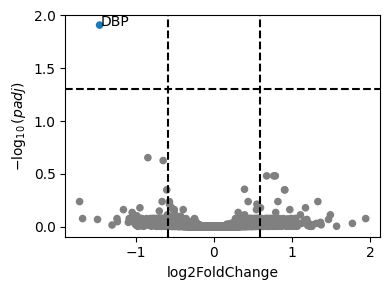

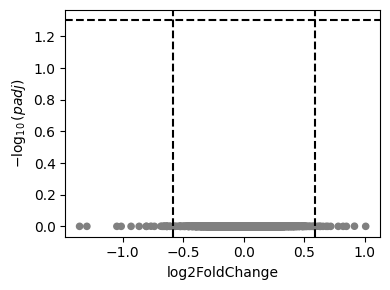

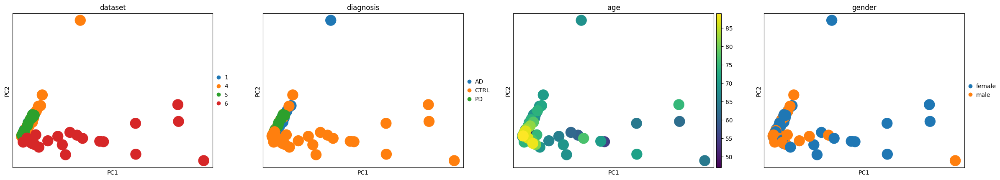

Fitting size factors...
... done in 0.02 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...


... done in 1.21 seconds.

Fitting dispersion trend curve...
... done in 0.14 seconds.

Fitting MAP dispersions...


... done in 1.04 seconds.

Fitting LFCs...


... done in 0.72 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.43 seconds.

Fitting size factors...
... done in 0.03 seconds.



Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      27.192161       -0.149578  0.197473 -0.757460  0.448774  0.999917
ISG15      33.190332        0.422725  0.292665  1.444402  0.148626  0.999917
SDF4       47.095124       -0.018865  0.193001 -0.097748  0.922133  0.999917
UBE2J2     25.421331       -0.181996  0.224635 -0.810186  0.417833  0.999917
ACAP3      12.773232        0.076795  0.431186  0.178102  0.858643  0.999917
...              ...             ...       ...       ...       ...       ...
MT-ND4L   985.588677       -0.004840  0.306192 -0.015806  0.987389  0.999917
MT-ND4   1170.665560       -0.119785  0.191199 -0.626493  0.530992  0.999917
MT-ND5    600.020651        0.227156  0.256859  0.884362  0.376501  0.999917
MT-ND6    239.245920       -0.152912  0.215273 -0.710317  0.477507  0.999917
MT-CYB   2039.438584        0.022816  0.273489  0.083427  0.933512  0.999917

[6657 rows x 6 c

Fitting dispersions...


... done in 1.18 seconds.

Fitting dispersion trend curve...
... done in 0.14 seconds.

Fitting MAP dispersions...


... done in 1.05 seconds.

Fitting LFCs...


... done in 0.72 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.44 seconds.



Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      25.561375       -0.284679  0.135331 -2.103576  0.035415  0.997735
ISG15      31.003291        0.157087  0.226005  0.695061  0.487017  0.997735
SDF4       50.386413        0.092155  0.116678  0.789823  0.429631  0.997735
B3GALT6    11.980421       -0.166214  0.174422 -0.952940  0.340620  0.997735
UBE2J2     28.549777        0.122042  0.131498  0.928084  0.353364  0.997735
...              ...             ...       ...       ...       ...       ...
MT-ND4L   779.285057       -0.079076  0.222627 -0.355193  0.722445  0.997735
MT-ND4    859.447249       -0.174621  0.149486 -1.168145  0.242748  0.997735
MT-ND5    496.008966       -0.132650  0.188025 -0.705488  0.480506  0.997735
MT-ND6    222.419211       -0.147481  0.135952 -1.084808  0.278007  0.997735
MT-CYB   1664.648570       -0.179815  0.197638 -0.909821  0.362917  0.997735

[6536 rows x 6 c

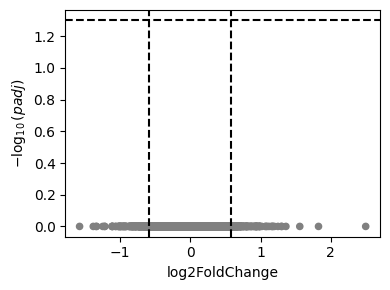

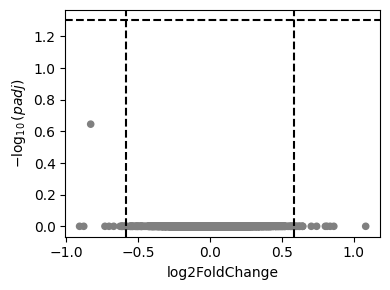

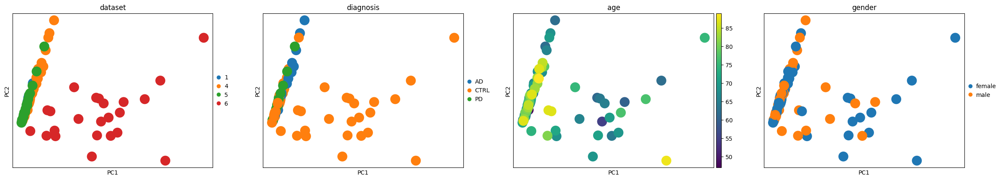

Fitting size factors...
... done in 0.05 seconds.

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + 

Using None as control genes, passed at DeseqDataSet initialization


/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)


/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X


Fitting dispersions...


... done in 2.01 seconds.

Fitting dispersion trend curve...


... done in 0.23 seconds.

Fitting MAP dispersions...


... done in 1.91 seconds.

Fitting LFCs...
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ 

... done in 1.12 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.63 seconds.

Fitting size factors...


Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
              baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       302.143869        0.069229  0.078893  0.877509  0.380210  0.921307
KLHL17       30.392493       -0.679678  0.305891 -2.221961  0.026286  0.717277
ISG15       463.786147        0.262208  0.206957  1.266970  0.205166  0.859628
AGRN          7.944788        0.084198  0.636845  0.132211  0.894817  0.989341
C1orf159     50.098431        0.100639  0.211289  0.476308  0.633855  0.973195
...                ...             ...       ...       ...       ...       ...
MT-ND4L   10944.317838        0.055108  0.225917  0.243930  0.807285  0.986514
MT-ND4    11019.231679        0.062497  0.155558  0.401760  0.687861  0.975082
MT-ND5     7740.819610        0.109210  0.187800  0.581525  0.560887  0.963446
MT-ND6     2726.730538       -0.217562  0.164420 -1.323214  0.185764  0.839063
MT-CYB    23139.577560        0.143268  0.206317  0.694408  0.487426  0.

... done in 0.05 seconds.

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
/rds/general/u

/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X


Fitting dispersions...


... done in 1.83 seconds.

Fitting dispersion trend curve...


... done in 0.23 seconds.

Fitting MAP dispersions...


... done in 1.97 seconds.

Fitting LFCs...
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ 

... done in 1.21 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.46 seconds.



Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      325.180533        0.064764  0.058886  1.099812  0.271414  0.551120
KLHL17      45.448238        0.032143  0.115102  0.279252  0.780051  0.897487
PLEKHN1     10.343189        0.185954  0.254822  0.729742  0.465548  0.713953
ISG15      461.709650       -0.001777  0.146626 -0.012117  0.990332  0.995313
AGRN         8.978959       -0.052356  0.333322 -0.157074  0.875186  0.944095
...               ...             ...       ...       ...       ...       ...
MT-ND4L  10255.612133       -0.176242  0.173431 -1.016211  0.309529  0.587328
MT-ND4    9863.761747       -0.181721  0.117844 -1.542046  0.123062  0.386650
MT-ND5    7483.296818       -0.234012  0.144606 -1.618272  0.105604  0.360649
MT-ND6    2936.420031       -0.231395  0.123926 -1.867210  0.061872  0.284508
MT-CYB   22683.403377       -0.207029  0.152329 -1.359087  0.174119  0.453930

[104

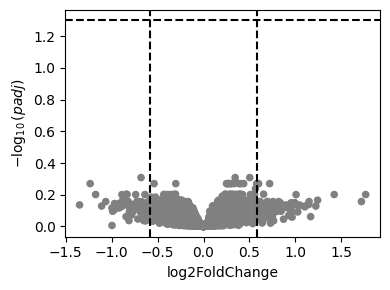

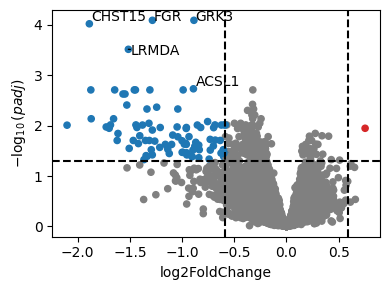

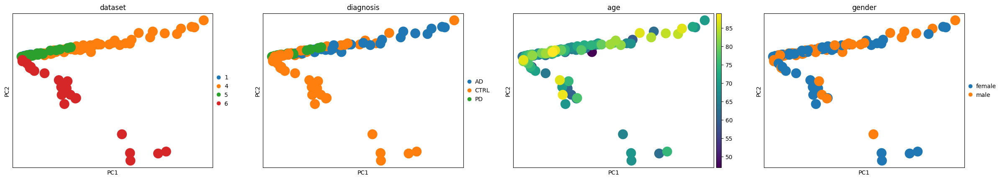

Fitting size factors...
... done in 0.04 seconds.



Using None as control genes, passed at DeseqDataSet initialization


/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X


Fitting dispersions...


... done in 1.71 seconds.

Fitting dispersion trend curve...
... done in 0.19 seconds.



Fitting MAP dispersions...


... done in 1.53 seconds.

Fitting LFCs...


/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X
/rds/general/user/ztb25/home/miniforge3/e

... done in 1.09 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.41 seconds.



Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       59.925810        0.084817  0.121102  0.700379  0.483691  0.873767
KLHL17       7.709995       -0.424897  0.502634 -0.845340  0.397921  0.840268
ISG15      122.810697        0.151959  0.221898  0.684817  0.493459  0.875888
C1orf159     9.151667        0.061667  0.341569  0.180541  0.856728  0.973147
TNFRSF18    48.894527       -0.032178  0.249420 -0.129012  0.897348  0.981155
...               ...             ...       ...       ...       ...       ...
MT-ND4L   2219.722389        0.048313  0.224391  0.215307  0.829528  0.967076
MT-ND4    2129.297382        0.029311  0.154642  0.189540  0.849669  0.970204
MT-ND5    1763.738384        0.100174  0.184013  0.544384  0.586177  0.908715
MT-ND6     550.418428       -0.242531  0.171218 -1.416508  0.156627  0.708133
MT-CYB    4832.950223        0.099233  0.204849  0.484420  0.628088  0.920614

[907

Fitting size factors...
... done in 0.05 seconds.



/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X


Fitting dispersions...


... done in 1.74 seconds.

Fitting dispersion trend curve...


... done in 0.21 seconds.

Fitting MAP dispersions...


... done in 1.71 seconds.

Fitting LFCs...


/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:378: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:232: RuntimeWarning: invalid value encountered in multiply
  - counts * np.log(mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:230: RuntimeWarning: invalid value encountered in subtract
  -logbinom
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:382: RuntimeWarning: overflow encountered in exp
  mu_ = np.maximum(size_factors * np.exp(X @ beta), min_mu)
/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/python3.11/site-packages/pydeseq2/utils.py:385: RuntimeWarning: invalid value encountered in divide
  + ((1 / disp + counts) * mu_ / (1 / disp + mu_)) @ X


... done in 1.02 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.47 seconds.



Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
             baseMean  log2FoldChange     lfcSE      stat    pvalue     padj
NOC2L       92.592291       -0.087119  0.060985 -1.428531  0.153139  0.99995
KLHL17      15.815847       -0.119120  0.125156 -0.951771  0.341213  0.99995
PLEKHN1      8.935744       -0.203043  0.188703 -1.075996  0.281929  0.99995
ISG15      179.913356       -0.089963  0.143512 -0.626867  0.530747  0.99995
C1orf159    16.209197       -0.098219  0.133805 -0.734050  0.462918  0.99995
...               ...             ...       ...       ...       ...      ...
MT-ND4L   2951.361667       -0.158387  0.171576 -0.923135  0.355937  0.99995
MT-ND4    2690.011540       -0.171874  0.119449 -1.438886  0.150183  0.99995
MT-ND5    2374.379878       -0.209037  0.145845 -1.433288  0.151776  0.99995
MT-ND6     824.673720       -0.169417  0.123292 -1.374111  0.169407  0.99995
MT-CYB    6765.665390       -0.200740  0.151998 -1.320674  0.186610  0.99995

[9497 rows x 6 c

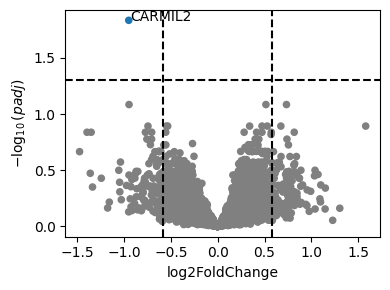

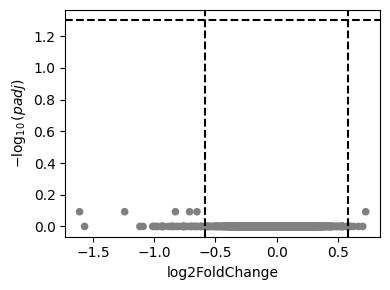

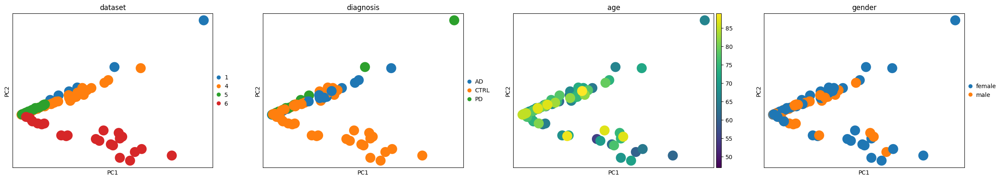

Fitting size factors...
... done in 0.04 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...


... done in 1.94 seconds.

Fitting dispersion trend curve...


... done in 0.21 seconds.

Fitting MAP dispersions...


... done in 1.73 seconds.

Fitting LFCs...


... done in 1.09 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.45 seconds.



Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       97.672917        0.040289  0.104320  0.386209  0.699342  0.997056
KLHL17      15.542493       -0.729654  0.391942 -1.861637  0.062654  0.867660
ISG15      179.247466        0.017609  0.213675  0.082413  0.934319  0.999357
C1orf159    19.170491       -0.111932  0.236993 -0.472299  0.636713  0.995652
TNFRSF18    19.844079        0.027742  0.432054  0.064210  0.948803  0.999357
...               ...             ...       ...       ...       ...       ...
MT-ND4L   3328.343571       -0.044401  0.202151 -0.219642  0.826150  0.999357
MT-ND4    3410.510342       -0.051902  0.151904 -0.341673  0.732597  0.997056
MT-ND5    2801.808405        0.056224  0.180075  0.312227  0.754868  0.997056
MT-ND6     968.031761       -0.218122  0.163554 -1.333635  0.182323  0.947677
MT-CYB    6721.011588        0.017468  0.222361  0.078556  0.937386  0.999357

[968

Fitting size factors...
... done in 0.04 seconds.



Fitting dispersions...


... done in 1.77 seconds.

Fitting dispersion trend curve...


... done in 0.21 seconds.

Fitting MAP dispersions...


... done in 1.74 seconds.

Fitting LFCs...


... done in 1.19 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.46 seconds.



Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       97.852183       -0.064211  0.065255 -0.984003  0.325114  0.934167
KLHL17      20.198424        0.023833  0.148445  0.160548  0.872449  0.988103
ISG15      176.840694       -0.113605  0.135784 -0.836657  0.402786  0.941321
C1orf159    21.023698       -0.141243  0.135012 -1.046152  0.295491  0.925355
TNFRSF18    21.019802        0.580621  0.303879  1.910697  0.056043  0.825552
...               ...             ...       ...       ...       ...       ...
MT-ND4L   3116.186292       -0.133589  0.156891 -0.851481  0.394502  0.941321
MT-ND4    2936.463213       -0.137192  0.116595 -1.176647  0.239336  0.917143
MT-ND5    2649.944927       -0.184185  0.134466 -1.369749  0.170765  0.891482
MT-ND6    1049.156301       -0.120381  0.119908 -1.003945  0.315405  0.933547
MT-CYB    6586.040914       -0.136387  0.158796 -0.858881  0.390406  0.941321

[951

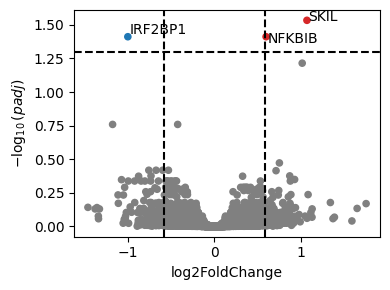

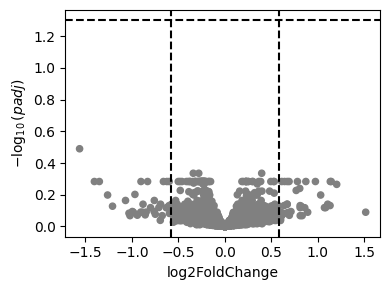

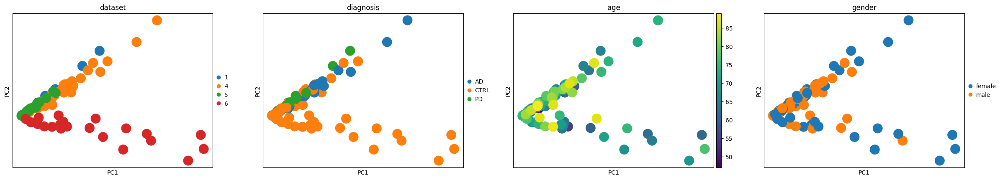

Fitting size factors...
... done in 0.04 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...


... done in 1.62 seconds.

Fitting dispersion trend curve...
... done in 0.19 seconds.

Fitting MAP dispersions...


... done in 1.57 seconds.

Fitting LFCs...


... done in 1.00 seconds.

Calculating cook's distance...
... done in 0.02 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.56 seconds.



Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       55.638106       -0.039691  0.121399 -0.326944  0.743710  0.961867
KLHL17       7.619884        0.219402  0.508370  0.431579  0.666047       NaN
ISG15       88.816263        0.145152  0.225123  0.644769  0.519077  0.919229
C1orf159     9.559528       -0.094048  0.323609 -0.290622  0.771340       NaN
TNFRSF4      9.201168       -0.393392  0.438844 -0.896427  0.370025       NaN
...               ...             ...       ...       ...       ...       ...
MT-ND4L   2204.620017        0.037926  0.196392  0.193115  0.846869  0.981366
MT-ND4    2147.178594       -0.007404  0.143281 -0.051673  0.958789  0.994457
MT-ND5    1695.314432        0.052182  0.172592  0.302345  0.762389  0.964332
MT-ND6     581.448059       -0.316285  0.157380 -2.009687  0.044464  0.590919
MT-CYB    4583.716294        0.032965  0.194755  0.169265  0.865588  0.984841

[911

Fitting size factors...
... done in 0.04 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...


... done in 1.57 seconds.

Fitting dispersion trend curve...
... done in 0.18 seconds.

Fitting MAP dispersions...


... done in 1.61 seconds.

Fitting LFCs...


... done in 1.04 seconds.

Calculating cook's distance...
... done in 0.03 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.43 seconds.



Log2 fold change & Wald test p-value: diagnosis AD vs CTRL
             baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L       65.561472        0.056503  0.074930  0.754070  0.450807  0.633959
KLHL17      11.501517        0.011716  0.140584  0.083336  0.933584       NaN
ISG15      100.219902        0.079045  0.147897  0.534458  0.593025  0.747516
C1orf159    12.320646       -0.209064  0.160844 -1.299792  0.193672       NaN
TNFRSF18     9.330024       -0.000276  0.271766 -0.001017  0.999188       NaN
...               ...             ...       ...       ...       ...       ...
MT-ND4L   2305.823198       -0.155885  0.150601 -1.035083  0.300630  0.508882
MT-ND4    2104.558626       -0.144151  0.111826 -1.289067  0.197375  0.403900
MT-ND5    1825.105382       -0.187935  0.135321 -1.388802  0.164893  0.365761
MT-ND6     707.497778       -0.166610  0.123805 -1.345738  0.178387  0.380479
MT-CYB    5056.856010       -0.172622  0.141582 -1.219238  0.222754  0.431666

[891

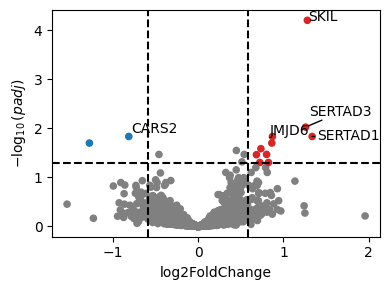

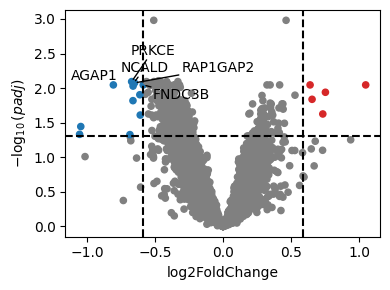

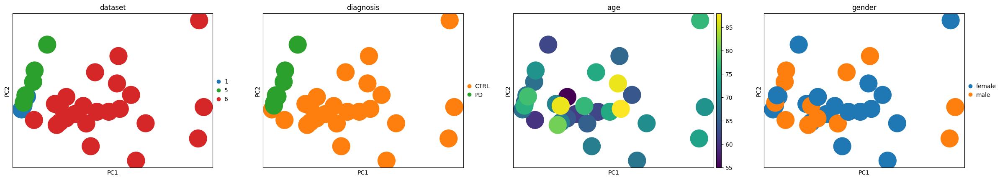

Fitting size factors...
... done in 0.02 seconds.



Using None as control genes, passed at DeseqDataSet initialization


Fitting dispersions...


... done in 1.30 seconds.

Fitting dispersion trend curve...
... done in 0.20 seconds.

Fitting MAP dispersions...


... done in 1.32 seconds.

Fitting LFCs...


... done in 0.88 seconds.

Calculating cook's distance...
... done in 0.01 seconds.

Replacing 0 outlier genes.

Running Wald tests...


... done in 0.41 seconds.



Log2 fold change & Wald test p-value: diagnosis PD vs CTRL
            baseMean  log2FoldChange     lfcSE      stat    pvalue      padj
NOC2L      45.449598        0.922995  0.684832  1.347768  0.177733  0.999284
ISG15      34.284059        1.295771  1.423845  0.910051  0.362796  0.999284
SDF4      106.208038        0.004755  0.609863  0.007798  0.993778  0.999295
B3GALT6    17.322819       -1.311287  1.233676 -1.062911  0.287823  0.999284
UBE2J2     47.747556       -1.013073  0.514240 -1.970039  0.048834  0.999284
...              ...             ...       ...       ...       ...       ...
MT-ND4L   546.938350        0.715640  0.804627  0.889406  0.373785  0.999284
MT-ND4   1031.171426        0.034241  0.416322  0.082246  0.934451  0.999284
MT-ND5    497.533749        0.572416  0.560249  1.021717  0.306915  0.999284
MT-ND6    610.069094       -0.961022  0.573270 -1.676387  0.093662  0.999284
MT-CYB    886.260598       -0.175478  0.837608 -0.209499  0.834059  0.999284

[8769 rows x 6 c

,gene,cell_type,contrast,log2FoldChange,stat,padj,padj_global
5292,FAM30A,Age-associated B cells,AD_vs_CTRL,4.190199,5.832913,0.000042,0.000971
173747,FGR,Tcm/Naive helper T cells,AD_vs_CTRL,-1.284506,-5.654449,0.000082,0.000971
223740,SKIL,Tem/Trm cytotoxic T cells,PD_vs_CTRL,1.280865,5.767585,0.000063,0.000971
183419,GRK3,Tcm/Naive helper T cells,AD_vs_CTRL,-0.886764,-5.686819,0.000082,0.000971
178833,CHST15,Tcm/Naive helper T cells,AD_vs_CTRL,-1.888701,-5.556727,0.000096,0.001366
44496,C15orf48,Classical monocytes,AD_vs_CTRL,2.617125,5.338303,0.000899,0.003886
178659,LRMDA,Tcm/Naive helper T cells,AD_vs_CTRL,-1.514858,-5.297207,0.000307,0.004175
9952,SKIL,CD16+ NK cells,PD_vs_CTRL,1.079278,5.222424,0.001192,0.004877
64485,IFNGR2,DC2,AD_vs_CTRL,0.915574,5.225698,0.001543,0.004877
10733,SAP30L,CD16+ NK cells,PD_vs_CTRL,-0.643906,-5.166712,0.001192,0.005922


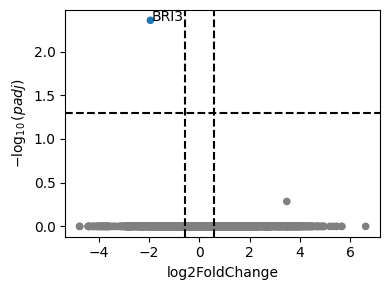

In [31]:
# =====================================================================
# Per-cell-type DE loop — mirrors the current Classical-monocytes workflow
#   * PD vs CTRL and AD vs CTRL run as SEPARATE objects/contrasts
#   * lowly-expressed genes filtered independently per contrast
#   * BH/FDR within each contrast (DESeq2 'padj') PLUS a second global
#     BH across every cell type x contrast actually tested
# =====================================================================
warnings.filterwarnings("ignore")       
inference = DefaultInference(n_cpus=8)

cell_types = pdata.obs["celltypist_cell_label_fine"].unique().tolist()

MIN_SAMPLES_PER_GROUP = 2      # need >=2 samples each side to fit a contrast
LFC_THR = 0.585                # ~1.5 fold
FDR_THR = 0.05

def run_one_contrast(pdata_ct, disease, base_design):
    """Run one <disease> vs CTRL contrast for one cell type, following the
    manual monocyte steps. Returns DESeq2 results_df (with within-contrast
    padj) or None if the contrast cannot be fit."""

    # 1. keep only the two diagnosis groups for this contrast
    sub = pdata_ct[pdata_ct.obs["diagnosis"].isin(["CTRL", disease])].copy()

    # need both groups present with enough samples, else skip
    n_per_group = sub.obs["diagnosis"].value_counts()
    if (n_per_group.get("CTRL", 0) < MIN_SAMPLES_PER_GROUP or
            n_per_group.get(disease, 0) < MIN_SAMPLES_PER_GROUP):
        print(f"   skip {disease}: too few samples {dict(n_per_group)}")
        return None

    # 2. filter lowly-expressed genes for THIS contrast's samples only
    dc.pp.filter_by_expr(sub, group="diagnosis")

    # 3. build counts (samples x genes) + metadata frames
    counts_df = pd.DataFrame(sub.X, columns=sub.var_names,
                             index=sub.obs["sample_combined"])
    metadata = sub.obs[["dataset", "diagnosis", "age", "gender"]].copy()
    metadata.index = counts_df.index
    metadata["diagnosis"] = pd.Categorical(metadata["diagnosis"],
                                           categories=["CTRL", disease])  # CTRL = reference

    # 4. drop any categorical covariate with a single level in this subset,
    #    otherwise the design matrix is rank-deficient and DESeq2 fails
    design_terms = []
    for term in base_design:
        if term in ("dataset", "gender") and metadata[term].astype(str).nunique() < 2:
            print(f"   dropping '{term}' from {disease} design (single level here)")
            continue
        design_terms.append(term)
    design = "~" + " + ".join(["diagnosis"] + design_terms)

    # 5. fit DESeq2, Wald test (BH within-contrast -> padj)
    dds = DeseqDataSet(counts=counts_df, metadata=metadata,
                       design=design, refit_cooks=True, inference=inference)
    dds.deseq2()
    ds = DeseqStats(dds, contrast=["diagnosis", disease, "CTRL"], inference=inference)
    ds.summary()
    return ds.results_df


all_results = []   # collected for the global FDR pass

for cell_type in cell_types:
    print(f"\n{'='*60}\n{cell_type}\n{'='*60}")
    mask = pdata.obs["celltypist_cell_label_fine"] == cell_type
    pdata_ct = pdata[mask].copy()

    # cell-type-specific PCA (QC only — not used by DESeq2)
    try:
        sc.tl.pca(pdata_ct, n_comps=min(50, pdata_ct.n_obs - 1))
        sc.pl.pca(pdata_ct, color=["dataset", "diagnosis", "age", "gender"])
    except Exception as e:
        print(f"   PCA skipped: {e}")
    # -------------------------------------------------------------------------

    for disease, base_design in [("PD", ["dataset", "age", "gender"]),
                                 ("AD", ["dataset", "age", "gender"])]:
        try:
            res = run_one_contrast(pdata_ct, disease, base_design)
        except Exception as e:
            print(f"   {disease} contrast failed: {e}")
            res = None
        if res is None:
            continue

        res = res.copy()
        res["cell_type"] = cell_type
        res["contrast"]  = f"{disease}_vs_CTRL"
        res["gene"]      = res.index
        all_results.append(res)

        n_sig = ((res["padj"] < FDR_THR) &
                 (res["log2FoldChange"].abs() > LFC_THR)).sum()
        print(f"   {disease} vs CTRL: {n_sig} sig genes "
              f"(within-contrast FDR<{FDR_THR}, |LFC|>{LFC_THR})")

        # volcano uses within-contrast padj (your volcano_plot already does)
        dc.pl.volcano(res, x="log2FoldChange", y="padj", thr_stat=0.585)

# ---------------------------------------------------------------------
# GLOBAL multiple-testing correction across every cell type x contrast.
# DESeq2's padj only corrects within one contrast; pooling here accounts
# for having run many contrasts.
# ---------------------------------------------------------------------
de_all = pd.concat(all_results, ignore_index=True)
ok = de_all["pvalue"].notna()
de_all["padj_global"] = np.nan
de_all.loc[ok, "padj_global"] = multipletests(de_all.loc[ok, "pvalue"],
                                               method="fdr_bh")[1]

sig_global = de_all[(de_all["padj_global"] < FDR_THR) &
                    (de_all["log2FoldChange"].abs() > LFC_THR)]
print(f"\nGlobal FDR<{FDR_THR}: {len(sig_global)} gene-hits "
      f"across all cell types/contrasts")
sig_global.sort_values("padj_global")[
    ["gene", "cell_type", "contrast", "log2FoldChange", "stat", "padj", "padj_global"]
]


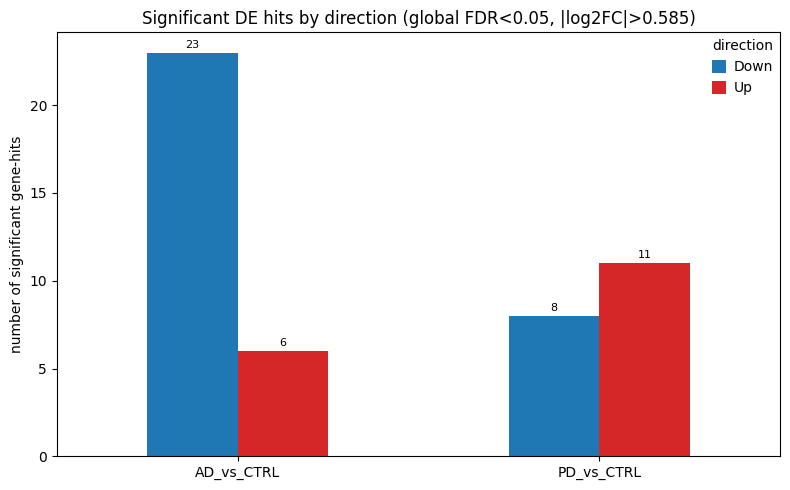

In [32]:
# --- up/down direction of each significant hit ---
sig = sig_global.copy()
sig["direction"] = np.where(sig["log2FoldChange"] > 0, "Up", "Down")

# counts per contrast, plus an 'Overall' row pooling all contrasts
counts = sig.groupby(["contrast", "direction"]).size().unstack(fill_value=0).reindex(columns=["Down", "Up"], fill_value=0)

# --- grouped bar chart ---
ax = counts.plot(kind="bar", figsize=(8, 5),
                 color={"Down": "#1f77b4", "Up": "#d62728"})  # blue=down, red=up
ax.set_ylabel("number of significant gene-hits")
ax.set_xlabel("")
ax.set_title(f"Significant DE hits by direction (global FDR<{FDR_THR}, |log2FC|>{LFC_THR})")
ax.set_xticklabels(counts.index, rotation=0)
ax.legend(title="direction")
for c in ax.containers:          # annotate counts on top of bars
    ax.bar_label(c, padding=2, fontsize=8)
plt.tight_layout()
plt.show()


In [33]:
### Correlation analysis between PD and AD DE results

rows, scatter = [], {}

for ct in de_all["cell_type"].unique():
    pd_res = de_all[(de_all.cell_type == ct) & (de_all.contrast == "PD_vs_CTRL")]
    ad_res = de_all[(de_all.cell_type == ct) & (de_all.contrast == "AD_vs_CTRL")]

    # genes tested in BOTH contrasts (filter_by_expr was per-contrast, so intersect)
    m = (pd_res.merge(ad_res, on="gene", suffixes=("_PD", "_AD"))
               .dropna(subset=["stat_PD", "stat_AD"]))
    if len(m) < 20:                       # too few shared genes to correlate
        continue

    rho, p = spearmanr(m["stat_PD"], m["stat_AD"])
    rows.append({"cell_type": ct, "n_genes": len(m), "rho": rho, "pval": p})
    scatter[ct] = m

corr = pd.DataFrame(rows)
# BH across the cell-type-level correlation tests  <-- the multiple-testing correction
corr["padj"] = multipletests(corr["pval"], method="fdr_bh")[1]
corr["sig"]  = corr["padj"] < 0.05
corr.sort_values("rho", ascending=False)


,cell_type,n_genes,rho,pval,padj,sig
1,Classical monocytes,9575,0.269555,4.682029e-159,6.086638e-158,True
0,CD16+ NK cells,9823,0.182731,1.652789e-74,1.074313e-73,True
6,Non-classical monocytes,8598,0.146789,1.278065e-42,4.153711e-42,True
9,Tcm/Naive helper T cells,10353,0.138081,3.041822e-45,1.318123e-44,True
10,Tem/Effector helper T cells,9038,0.133734,2.425266e-37,6.305691e-37,True
11,Tem/Temra cytotoxic T cells,9500,0.127819,6.750669e-36,1.462645e-35,True
12,Tem/Trm cytotoxic T cells,8896,0.100323,2.424329e-21,4.502325e-21,True
7,Regulatory T cells,6423,0.052160,2.885759e-05,4.689358e-05,True
5,Naive B cells,7897,0.034382,2.245102e-03,2.918632e-03,True
2,DC2,8637,0.022283,3.837358e-02,4.157137e-02,True


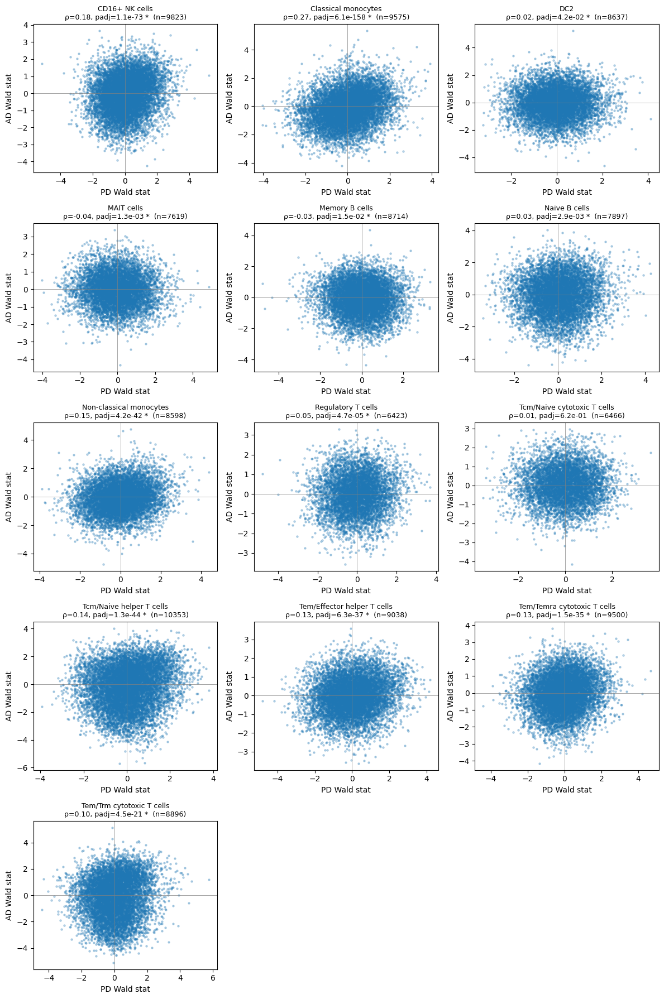

In [34]:
n = len(scatter); ncol = 3; nrow = int(np.ceil(n / ncol))
fig, axes = plt.subplots(nrow, ncol, figsize=(4*ncol, 3.6*nrow), squeeze=False)

for ax, (ct, m) in zip(axes.flat, scatter.items()):
    ax.scatter(m["stat_PD"], m["stat_AD"], s=5, alpha=0.3)
    r = corr.loc[corr.cell_type == ct].iloc[0]
    ax.axhline(0, color="grey", lw=0.5); ax.axvline(0, color="grey", lw=0.5)
    star = " *" if r["sig"] else ""
    ax.set_title(f"{ct}\nρ={r['rho']:.2f}, padj={r['padj']:.1e}{star}  (n={r['n_genes']})",
                 fontsize=9)
    ax.set_xlabel("PD Wald stat"); ax.set_ylabel("AD Wald stat")

for ax in axes.flat[n:]:
    ax.axis("off")
plt.tight_layout(); plt.show()


In [35]:
from scipy.stats import hypergeom
from statsmodels.stats.multitest import multipletests
import numpy as np, matplotlib.pyplot as plt

PADJ_COL, LFC_THR, FDR_THR = "padj", 0.585, 0.05    # use "padj_global" if you prefer

def sig_lfc(df):                                     # significant genes -> their log2FC
    s = df[(df[PADJ_COL] < FDR_THR) & (df["log2FoldChange"].abs() > LFC_THR)]
    return s.set_index("gene")["log2FoldChange"]

rows, shared_tables = [], {}
for ct in de_all["cell_type"].unique():
    pd_res = de_all[(de_all.cell_type == ct) & (de_all.contrast == "PD_vs_CTRL")]
    ad_res = de_all[(de_all.cell_type == ct) & (de_all.contrast == "AD_vs_CTRL")]

    universe = set(pd_res["gene"]) & set(ad_res["gene"])      # tested in BOTH
    if len(universe) < 20:
        continue

    pd_sig = sig_lfc(pd_res); pd_sig = pd_sig[pd_sig.index.isin(universe)]
    ad_sig = sig_lfc(ad_res); ad_sig = ad_sig[ad_sig.index.isin(universe)]
    shared = pd_sig.index.intersection(ad_sig.index)

    same_dir = int((np.sign(pd_sig[shared]) == np.sign(ad_sig[shared])).sum())

    # hypergeometric: is the overlap bigger than chance?
    M, n, N, k = len(universe), len(pd_sig), len(ad_sig), len(shared)
    p = hypergeom.sf(k - 1, M, n, N) if (n > 0 and N > 0) else np.nan

    rows.append({"cell_type": ct, "PD_sig": n, "AD_sig": N, "shared": k,
                 "same_direction": same_dir, "universe": M, "pval": p})
    if k > 0:
        shared_tables[ct] = pd.DataFrame({"log2FC_PD": pd_sig[shared],
                                          "log2FC_AD": ad_sig[shared]})

ov = pd.DataFrame(rows)
ok = ov["pval"].notna()
ov["padj"] = np.nan
ov.loc[ok, "padj"] = multipletests(ov.loc[ok, "pval"], method="fdr_bh")[1]   # across cell types
ov["sig_overlap"] = ov["padj"] < 0.05
ov.sort_values("shared", ascending=False)


,cell_type,PD_sig,AD_sig,shared,same_direction,universe,pval,padj,sig_overlap
0,CD16+ NK cells,3,0,0,0,9823,NaN,NaN,False
1,Classical monocytes,0,8,0,0,9575,NaN,NaN,False
2,DC2,0,2,0,0,8637,NaN,NaN,False
3,MAIT cells,4,0,0,0,7619,NaN,NaN,False
4,Memory B cells,3,3,0,0,8714,1.0,1.0,False
5,Naive B cells,0,2,0,0,7897,NaN,NaN,False
6,Non-classical monocytes,0,3,0,0,8598,NaN,NaN,False
7,Regulatory T cells,1,0,0,0,6423,NaN,NaN,False
8,Tcm/Naive cytotoxic T cells,0,0,0,0,6466,NaN,NaN,False
9,Tcm/Naive helper T cells,0,95,0,0,10353,NaN,NaN,False


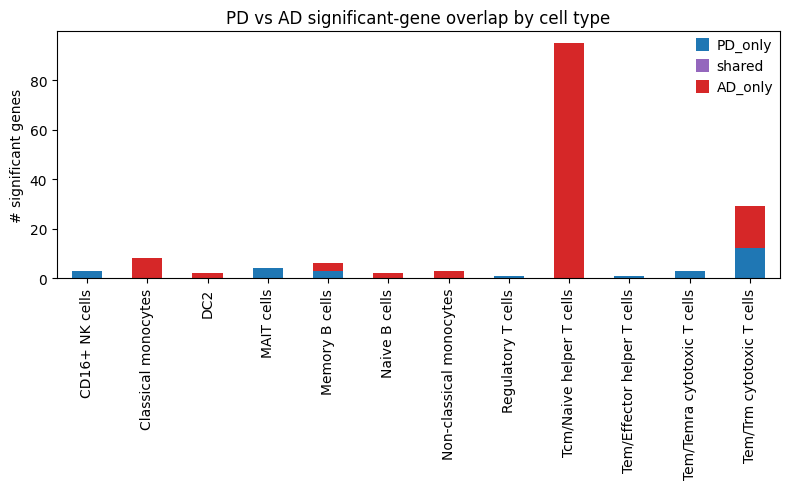

In [36]:
b = ov.copy()
b["PD_only"] = b["PD_sig"] - b["shared"]
b["AD_only"] = b["AD_sig"] - b["shared"]
b = b.set_index("cell_type")[["PD_only", "shared", "AD_only"]]
b = b[b.sum(axis=1) > 0]
ax = b.plot(kind="bar", stacked=True, figsize=(8, 5),
            color={"PD_only": "#1f77b4", "shared": "#9467bd", "AD_only": "#d62728"})
ax.set_ylabel("# significant genes"); ax.set_xlabel("")
ax.set_title("PD vs AD significant-gene overlap by cell type")
plt.tight_layout(); plt.show()

In [37]:
### Pathway analysis

# pre-ranked GSEA (per cell type x contrast) using the wald statistic as the ranking metric
sub = de_all[(de_all["cell_type"] == "Classical monocytes") &
             (de_all["contrast"]  == "PD_vs_CTRL")].copy()

# rank by signed Wald stat; drop genes DESeq2 couldn't test (NaN from Cook's/filtering)
rnk = (sub.dropna(subset=["stat"])
          .drop_duplicates("gene")
          .sort_values("stat", ascending=False)[["gene", "stat"]])

pre_res = gp.prerank(
    rnk=rnk,                                   # 2-col df: gene, score
    gene_sets=["KEGG_2021_Human"],
    min_size=15, max_size=500,                 # ignore tiny/huge gene sets
    permutation_num=1000,
    seed=0,
    outdir=None,
)
pre_res.res2d.sort_values("NES").head()        # NES, FDR q-val, leading-edge genes


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes
20,prerank,KEGG_2021_Human__Mismatch repair,-0.519961,-1.679264,0.007782,0.530057,0.502,8/22,15.22%,MSH6;RPA4;MLH3;MSH3;MLH1;MSH2;POLD2;RFC3
22,prerank,KEGG_2021_Human__Fanconi anemia pathway,-0.434322,-1.644571,0.011628,0.355200,0.591,21/45,21.03%,ATRIP;SLX4;BLM;RMI1;MUS81;POLI;POLK;RPA4;TOP3B...
28,prerank,KEGG_2021_Human__Ribosome biogenesis in eukary...,-0.381516,-1.568720,0.007313,0.449600,0.798,22/67,17.26%,GNL3;GNL3L;RBM28;NAT10;WDR3;RPP25;DROSHA;BMS1;...
32,prerank,KEGG_2021_Human__Platelet activation,-0.350052,-1.514671,0.001934,0.518743,0.906,22/85,14.26%,PIK3R6;P2RY12;PTGS1;ROCK2;ADCY7;GP1BB;ITGB3;IT...
34,prerank,KEGG_2021_Human__Herpes simplex virus 1 infection,-0.277659,-1.478767,0.000000,0.546651,0.949,132/348,29.10%,ZNF282;ZNF561;ZNF140;ZNF510;ZNF555;TP53;MAVS;I...


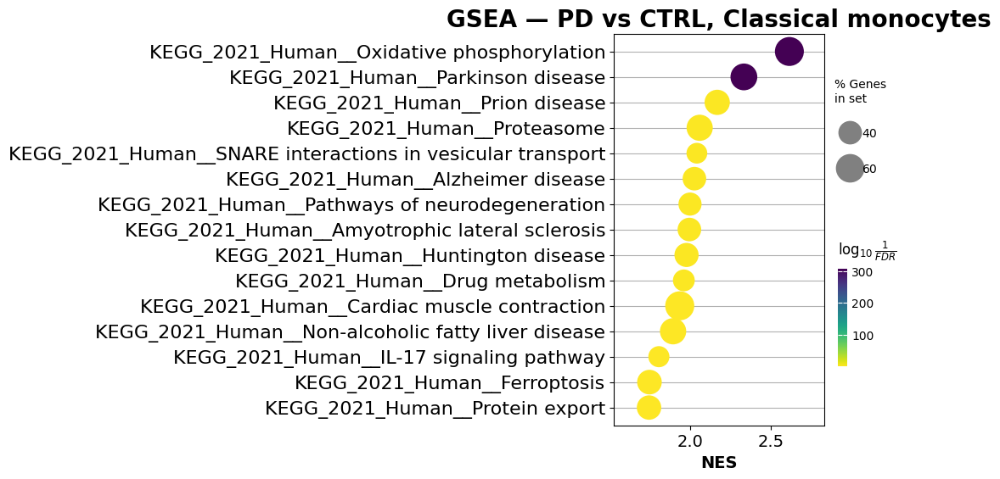

In [38]:
ax = dotplot(pre_res.res2d,
             column="FDR q-val",         # colour by FDR
             title="GSEA — PD vs CTRL, Classical monocytes",
             cmap="viridis_r",
             size=5,
             top_term=15,                # show top 15 terms
             figsize=(4, 6),
             cutoff=1)                    # <-- so something is still plotted even when no significant terms, else dotplot fails


[<Axes: xlabel='Gene Rank', ylabel='Ranked metric'>,
 <Axes: >,
 <Axes: >,
 <Axes: ylabel='Enrichment Score'>]

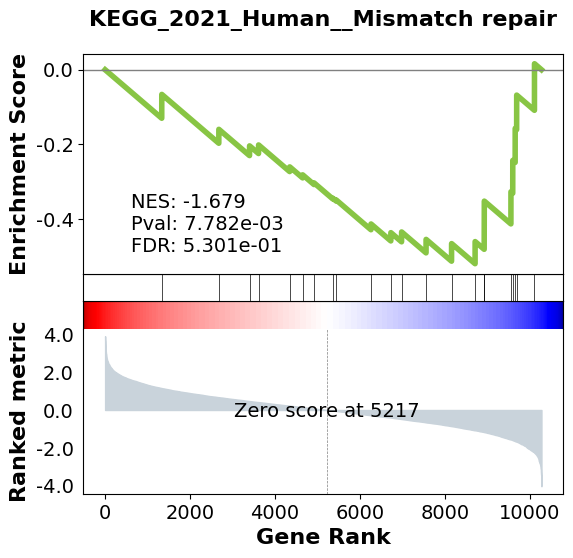

In [39]:
term = pre_res.res2d.sort_values("NES")["Term"].iloc[0]   # e.g. most negative NES
gseaplot(rank_metric=pre_res.ranking,
         term=term,
         **pre_res.results[term],         # unpacks ES, hits, RES, etc.
         ofname=None)


In [40]:
# Pathway analysis loop for all cell types x contrasts

# LIBRARIES = {
#     "GO_BP":        "GO_Biological_Process_2021",
#     "Reactome":     "Reactome_2022",
#     "KEGG":         "KEGG_2021_Human",
#     "WikiPathways": "WikiPathways_2024_Human",
# }
GENE_SETS    = "GO_Biological_Process_2026"   # one primary library (for compatibility with semantic similarity reduction)
GENE_SET_LABEL = "GO_BP"
FDR_TERM_THR = 0.05
MIN_RANKED   = 15                             # need enough ranked genes to bother

prerank_all  = []     # collect res2d tables across all cell types/contrasts
prerank_objs = {}     # keep full result objects, keyed by (cell_type, contrast), for plotting

pairs = de_all[["cell_type", "contrast"]].drop_duplicates().itertuples(index=False)

for cell_type, contrast in pairs:
    sub = de_all[(de_all["cell_type"] == cell_type) & (de_all["contrast"] == contrast)]

    # ranking: unique genes, drop genes DESeq2 couldn't test, sort high -> low by Wald stat
    rnk = (sub.dropna(subset=["stat"])
              .drop_duplicates("gene")
              .sort_values("stat", ascending=False)[["gene", "stat"]])

    if rnk.shape[0] < MIN_RANKED:
        print(f"skip {cell_type} | {contrast}: only {rnk.shape[0]} ranked genes")
        continue

    try:
        pre = gp.prerank(rnk=rnk, gene_sets=GENE_SETS,
                        min_size=15, max_size=500,
                        permutation_num=1000, seed=0,
                        threads=4, outdir=None, no_plot=True)
    except Exception as e:
        print(f"prerank failed for {cell_type} | {contrast}: {e}")
        continue


    res = pre.res2d.copy()
    res["cell_type"] = cell_type
    res["contrast"]  = contrast
    res["library"] = GENE_SET_LABEL
    res["FDR q-val"] = pd.to_numeric(res["FDR q-val"], errors="coerce")
    res["NES"]       = pd.to_numeric(res["NES"], errors="coerce")
    res["significant"] = res["FDR q-val"] < FDR_TERM_THR     # <-- significance flag kept here
    prerank_all.append(res)
    prerank_objs[(cell_type, contrast, GENE_SET_LABEL)] = pre

    print(f"{cell_type} | {contrast}: {res['significant'].sum()} terms at "
        f"FDR<{FDR_TERM_THR} (of {len(res)} tested)")

gsea_all = pd.concat(prerank_all, ignore_index=True)

# all genuinely significant pathways across everything:
gsea_all[gsea_all["significant"]].sort_values(["cell_type", "contrast", "FDR q-val"])


Age-associated B cells | AD_vs_CTRL: 0 terms at FDR<0.05 (of 1461 tested)


CD16+ NK cells | PD_vs_CTRL: 30 terms at FDR<0.05 (of 1815 tested)


CD16+ NK cells | AD_vs_CTRL: 13 terms at FDR<0.05 (of 1782 tested)


Classical monocytes | PD_vs_CTRL: 9 terms at FDR<0.05 (of 1878 tested)


Classical monocytes | AD_vs_CTRL: 46 terms at FDR<0.05 (of 1793 tested)


DC2 | PD_vs_CTRL: 1 terms at FDR<0.05 (of 1629 tested)


DC2 | AD_vs_CTRL: 5 terms at FDR<0.05 (of 1679 tested)


MAIT cells | PD_vs_CTRL: 0 terms at FDR<0.05 (of 1479 tested)


MAIT cells | AD_vs_CTRL: 0 terms at FDR<0.05 (of 1433 tested)


Memory B cells | PD_vs_CTRL: 0 terms at FDR<0.05 (of 1642 tested)


Memory B cells | AD_vs_CTRL: 0 terms at FDR<0.05 (of 1597 tested)


NK cells | AD_vs_CTRL: 0 terms at FDR<0.05 (of 872 tested)


Naive B cells | PD_vs_CTRL: 2 terms at FDR<0.05 (of 1506 tested)


Naive B cells | AD_vs_CTRL: 23 terms at FDR<0.05 (of 1469 tested)


Non-classical monocytes | PD_vs_CTRL: 18 terms at FDR<0.05 (of 1693 tested)


Non-classical monocytes | AD_vs_CTRL: 33 terms at FDR<0.05 (of 1634 tested)


Regulatory T cells | PD_vs_CTRL: 0 terms at FDR<0.05 (of 1379 tested)


Regulatory T cells | AD_vs_CTRL: 0 terms at FDR<0.05 (of 1241 tested)


Tcm/Naive cytotoxic T cells | PD_vs_CTRL: 0 terms at FDR<0.05 (of 1251 tested)


Tcm/Naive cytotoxic T cells | AD_vs_CTRL: 0 terms at FDR<0.05 (of 1230 tested)


Tcm/Naive helper T cells | PD_vs_CTRL: 10 terms at FDR<0.05 (of 1884 tested)


Tcm/Naive helper T cells | AD_vs_CTRL: 48 terms at FDR<0.05 (of 1872 tested)


Tem/Effector helper T cells | PD_vs_CTRL: 11 terms at FDR<0.05 (of 1673 tested)


Tem/Effector helper T cells | AD_vs_CTRL: 0 terms at FDR<0.05 (of 1713 tested)


Tem/Temra cytotoxic T cells | PD_vs_CTRL: 1 terms at FDR<0.05 (of 1769 tested)


Tem/Temra cytotoxic T cells | AD_vs_CTRL: 2 terms at FDR<0.05 (of 1715 tested)


Tem/Trm cytotoxic T cells | PD_vs_CTRL: 6 terms at FDR<0.05 (of 1684 tested)


Tem/Trm cytotoxic T cells | AD_vs_CTRL: 15 terms at FDR<0.05 (of 1641 tested)


pDC | PD_vs_CTRL: 1 terms at FDR<0.05 (of 1639 tested)


,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,cell_type,contrast,library,significant
3276,prerank,Post-translational Protein Targeting to Endopl...,0.707189,2.282540,0.000000,0.005396,0.005,10/17,16.24%,HSPA5;SSR2;BAG6;UBL4A;SEC61G;SEC62;SSR1;SSR3;S...,CD16+ NK cells,AD_vs_CTRL,GO_BP,True
3277,prerank,U2-type Prespliceosome Assembly (GO:1903241),0.645415,2.209252,0.000000,0.009713,0.018,12/25,13.21%,SF3A1;SNRPA1;SNRPB;DDX42;SF3B4;SNRPF;SF3B2;SF3...,CD16+ NK cells,AD_vs_CTRL,GO_BP,True
3286,prerank,Oxidative Phosphorylation (GO:0006119),0.479775,2.048524,0.000000,0.023742,0.161,35/57,29.12%,UQCRB;NDUFB9;NDUFA5;ATP5F1B;NDUFA1;NDUFS5;NDUF...,CD16+ NK cells,AD_vs_CTRL,GO_BP,True
3284,prerank,Regulation of Immunoglobulin Production (GO:00...,0.682912,2.064485,0.000000,0.023896,0.129,7/15,12.30%,TNFRSF4;XBP1;GPI;CLCF1;PHB2;VAMP3;SASH3,CD16+ NK cells,AD_vs_CTRL,GO_BP,True
3281,prerank,Positive Regulation of Production of Molecular...,0.616890,2.091217,0.000000,0.024605,0.099,9/22,12.30%,LAPTM5;TNFRSF4;XBP1;GPI;CLCF1;PHB2;VAMP3;TNFRS...,CD16+ NK cells,AD_vs_CTRL,GO_BP,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41093,prerank,Regulation of Fatty Acid Biosynthetic Process ...,0.695424,2.034122,0.001869,0.043701,0.143,6/16,9.29%,SIRT2;LPGAT1;WDTC1;NR1H2;NME1;UBR4,Tem/Trm cytotoxic T cells,PD_vs_CTRL,GO_BP,True
41097,prerank,Adenylate Cyclase-Inhibiting G Protein-Coupled...,0.665055,1.983598,0.000000,0.044192,0.238,8/18,10.45%,RGS1;GPR35;PSAP;PTGER4;ADRB2;NMUR1;CXCR4;GNAI3,Tem/Trm cytotoxic T cells,PD_vs_CTRL,GO_BP,True
41092,prerank,Cellular Respiration (GO:0045333),0.481127,2.047508,0.000000,0.046647,0.123,42/78,26.28%,CYCS;NR4A3;NDUFC2;NDUFB8;ETFA;UQCRFS1;NDUFA1;C...,Tem/Trm cytotoxic T cells,PD_vs_CTRL,GO_BP,True
41095,prerank,Positive Regulation of DNA-templated Transcrip...,0.508298,1.996532,0.000000,0.047524,0.205,25/57,18.46%,MED19;PWWP2B;CDK9;MED10;MED9;MED26;TCERG1;MED3...,Tem/Trm cytotoxic T cells,PD_vs_CTRL,GO_BP,True


In [41]:
g = gsea_all.copy()
g["NOM p-val"] = pd.to_numeric(g["NOM p-val"], errors="coerce")

g["fdr_library"] = np.nan
# one BH per library — pooling across cell types AND contrasts (PD + AD together)
for lib, idx in g.groupby("library").groups.items():
    sub = g.loc[idx]
    ok  = sub["NOM p-val"].notna()
    g.loc[sub.index[ok], "fdr_library"] = multipletests(
        sub.loc[ok, "NOM p-val"], method="fdr_bh")[1]

g["sig"] = g["fdr_library"] < 0.05

# check it ran per library
g.groupby("library")["sig"].sum()

# show only significant results
g[g["sig"]]



,Name,Term,ES,NES,NOM p-val,FDR q-val,FWER p-val,Tag %,Gene %,Lead_genes,cell_type,contrast,library,significant,fdr_library,sig
1,prerank,Negative Regulation of G1/S Transition of Mito...,-0.589016,-1.909739,0.0,0.755414,0.477,8/20,6.18%,PLK3;WEE1;CDKN2D;SLFN11;ZC3H12D;ZNF655;DLG1;KLF4,Age-associated B cells,AD_vs_CTRL,GO_BP,False,0.0,True
2,prerank,Nicotinamide Nucleotide Metabolic Process (GO:...,0.631546,1.875198,0.0,0.445089,0.526,10/18,24.12%,NAXE;PFKM;UCP2;PFKFB3;ENO1;PFKFB2;MDH1;IDH2;AL...,Age-associated B cells,AD_vs_CTRL,GO_BP,False,0.0,True
4,prerank,Mitochondrial ATP Synthesis Coupled Electron T...,0.480546,1.835784,0.0,0.464804,0.688,18/56,16.04%,NDUFS1;NDUFB7;NDUFC2;UQCRC2;NDUFA12;NDUFA8;NDU...,Age-associated B cells,AD_vs_CTRL,GO_BP,False,0.0,True
7,prerank,Negative Regulation of Cytokine-Mediated Signa...,-0.465238,-1.760395,0.0,0.602537,0.924,19/40,26.78%,RNF113A;ZNF675;SORL1;XIAP;IRAK3;SAMHD1;ANXA4;S...,Age-associated B cells,AD_vs_CTRL,GO_BP,False,0.0,True
10,prerank,Regulation of Stem Cell Population Maintenance...,0.451332,1.723631,0.0,0.899802,0.962,20/51,23.68%,DDB1;BRD9;ZNF706;ACTL6A;HDAC1;ELAVL1;REST;SMAR...,Age-associated B cells,AD_vs_CTRL,GO_BP,False,0.0,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44416,prerank,Vacuolar Transport (GO:0007034),-0.587322,-1.939102,0.0,0.559331,0.413,7/24,10.34%,VPS54;AP3D1;GRN;ATP13A2;VPS53;ALS2;HGSNAT,pDC,PD_vs_CTRL,GO_BP,False,0.0,True
44417,prerank,Regulation of Protein Export From Nucleus (GO:...,-0.661510,-1.930063,0.0,0.302057,0.436,7/16,11.39%,GAS6;MLLT6;EMD;TPR;SIRT7;BARD1;SIRT6,pDC,PD_vs_CTRL,GO_BP,False,0.0,True
44418,prerank,Response to Type I Interferon (GO:0034340),0.502294,1.921792,0.0,0.255741,0.450,16/40,15.50%,PSMD2;PSMC4;PSMA4;SHFL;PSMB3;SP100;MX1;SEM1;PS...,pDC,PD_vs_CTRL,GO_BP,False,0.0,True
44420,prerank,Positive Regulation of RNA Splicing (GO:0033120),0.593984,1.899333,0.0,0.199170,0.537,10/19,21.58%,SNW1;ZPR1;DAZAP1;SETX;POLR2A;THRAP3;TRA2B;PIK3...,pDC,PD_vs_CTRL,GO_BP,False,0.0,True


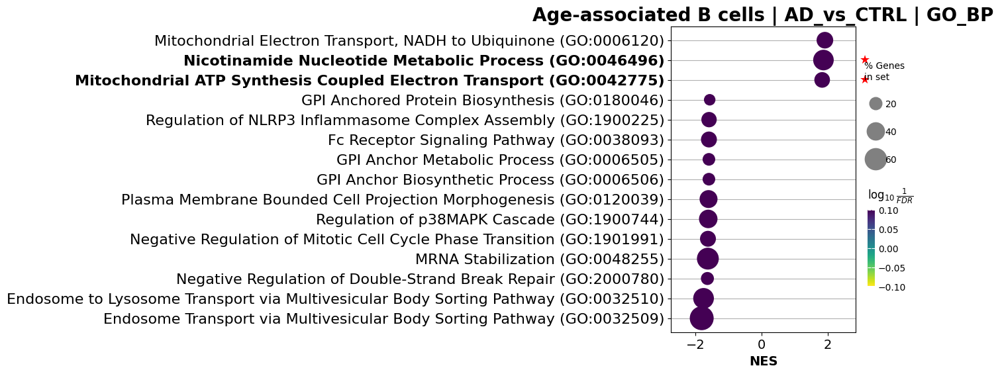

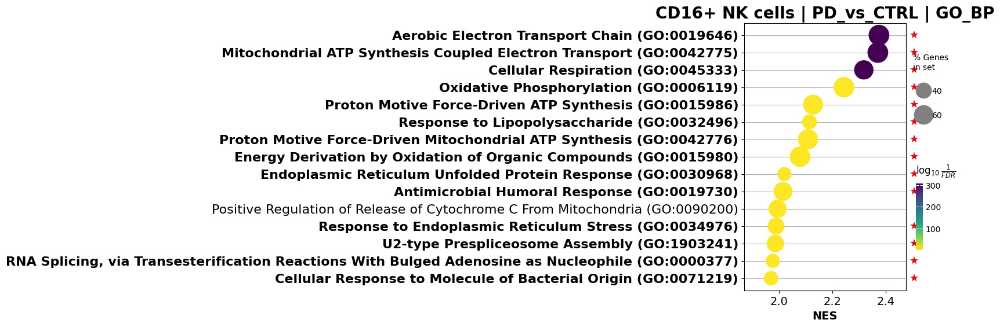

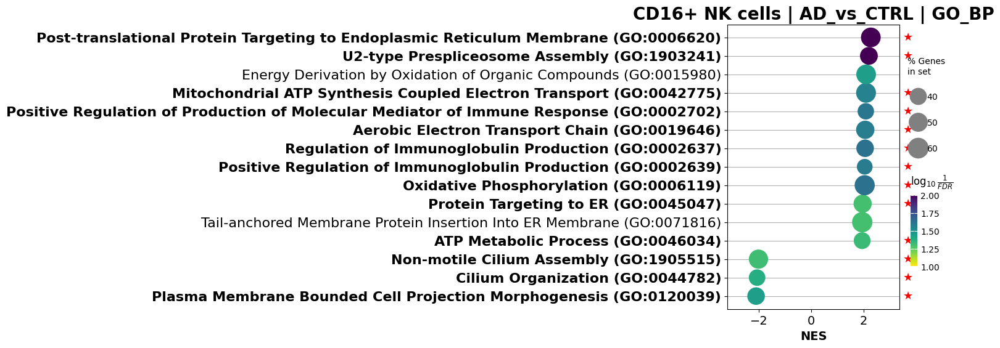

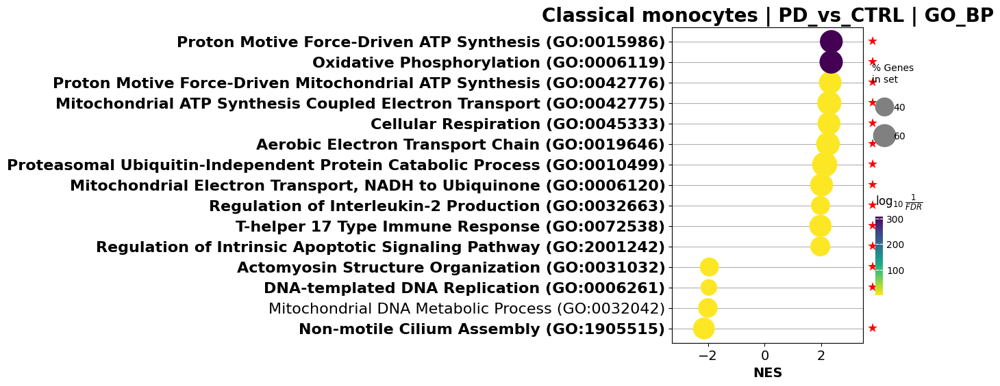

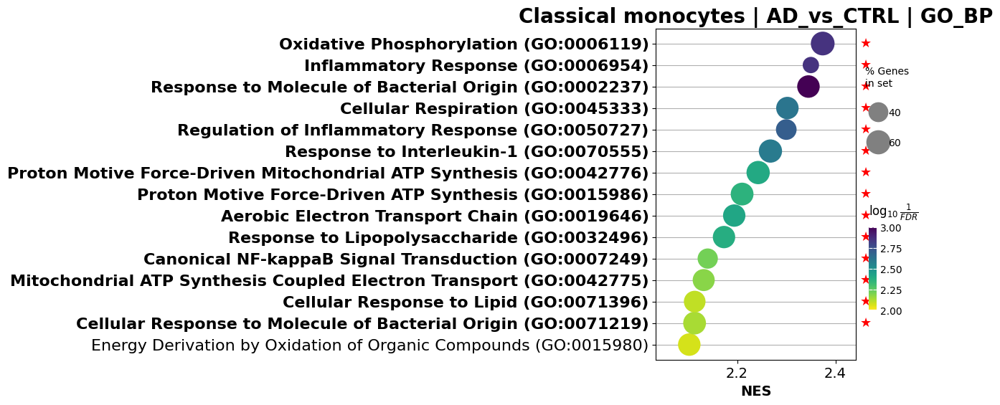

...

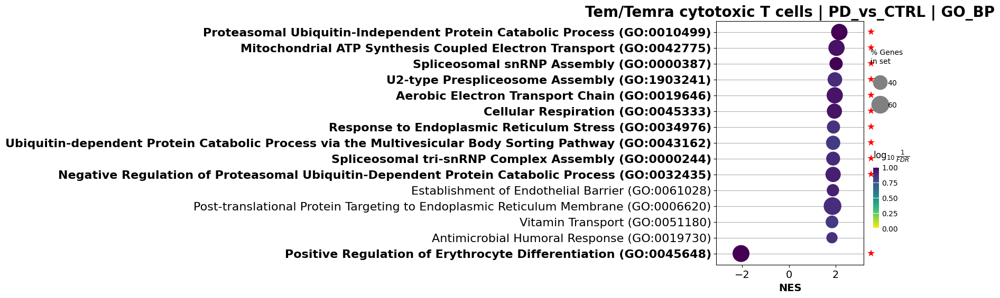

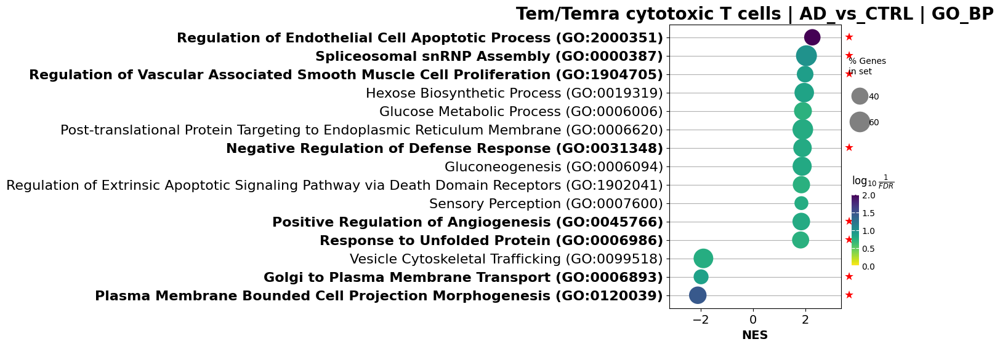

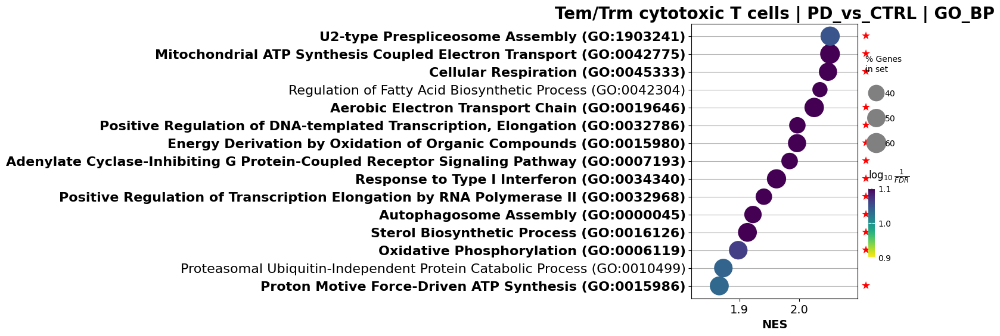

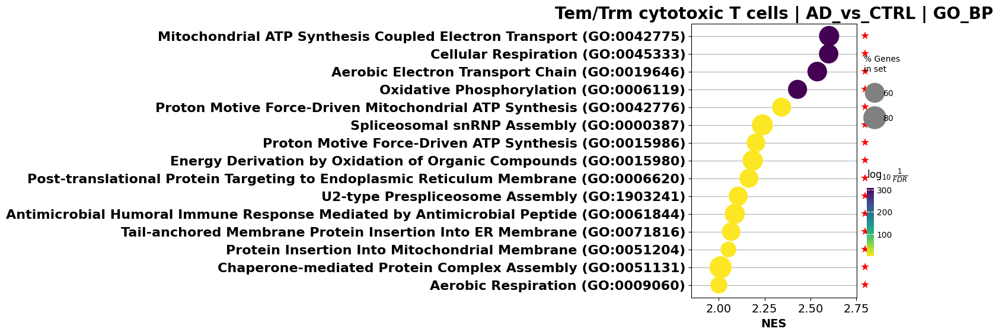

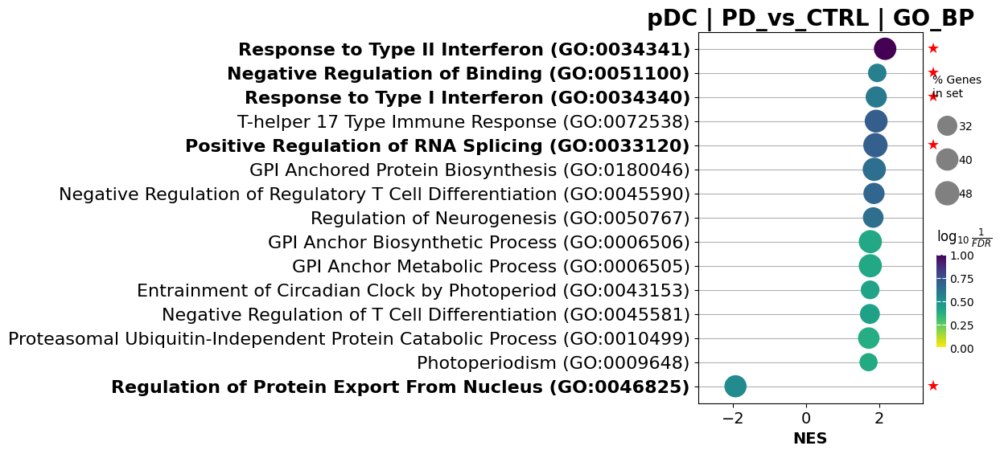

In [42]:
for (ct, contrast, lib), pre in prerank_objs.items():
    df = pre.res2d.copy()
    df["FDR q-val"] = pd.to_numeric(df["FDR q-val"], errors="coerce")
    
    # terms significant under your corrected FDR (from the pooled table g)
    sig_terms = set(
        g[(g["cell_type"] == ct) & (g["contrast"] == contrast) &
        (g["library"] == lib) & (g["fdr_library"] < 0.05)]["Term"]
    )

    ax = dotplot(df, column="FDR q-val", top_term=15, cutoff=1,
                title=f"{ct} | {contrast} | {lib}", figsize=(4.5, 6), cmap="viridis_r")

    # star each significant row, just right of the plot
    for ytick, lbl in zip(ax.get_yticks(), ax.get_yticklabels()):
        if lbl.get_text() in sig_terms:
            ax.annotate("★", xy=(1.02, ytick),
                        xycoords=("axes fraction", "data"),
                        ha="left", va="center", fontsize=13, color="red",
                        annotation_clip=False)
            lbl.set_fontweight("bold")        # also bold the label
    plt.show()

In [43]:
# sig = g[g["sig"]].copy()

# for contrast, d in sig.groupby("contrast"):
#     mat = d.pivot_table(index="cell_type", columns="library",
#                         values="Term", aggfunc="count", fill_value=0)
#     plt.figure(figsize=(6, 4))
#     sns.heatmap(mat, annot=True, fmt="d", cmap="Blues")
#     plt.title(f"# significant pathways — {contrast}")
#     plt.tight_layout(); plt.show()


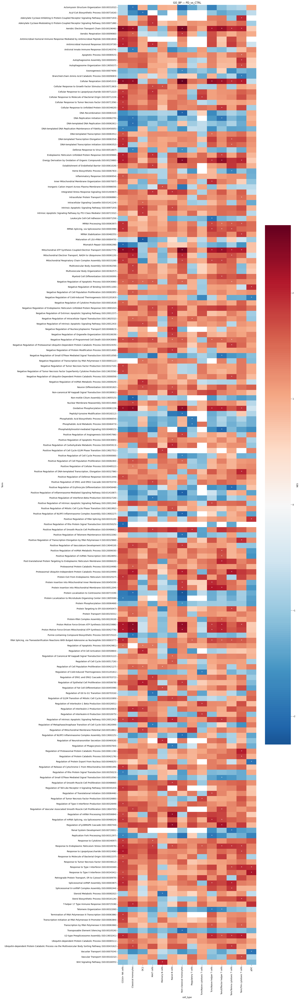

In [44]:
lib, contrast = "GO_BP", "PD_vs_CTRL"
d = g[(g["library"] == lib) & (g["contrast"] == contrast)].copy()

terms = d.loc[d["sig"], "Term"].unique()                 # sig in ≥1 cell type
nes = d[d["Term"].isin(terms)].pivot_table(index="Term", columns="cell_type", values="NES")
sigmask = d[d["Term"].isin(terms)].pivot_table(index="Term", columns="cell_type",
                                               values="sig", aggfunc="any").fillna(False)

plt.figure(figsize=(1.2*nes.shape[1]+3, 0.35*len(terms)+2))
sns.heatmap(nes, cmap="RdBu_r", center=0,
            annot=sigmask.replace({True: "*", False: ""}), fmt="",
            cbar_kws={"label": "NES"})
plt.title(f"{lib} — {contrast}")
plt.tight_layout(); plt.show()

In [45]:
# import seaborn as sns, matplotlib.pyplot as plt, numpy as np

# def nes_heatmap(g, library, contrast, max_terms=40, truncate=55):
#     d = g[(g["library"] == library) & (g["contrast"] == contrast)].copy()

#     terms = d.loc[d["sig"], "Term"].unique()              # sig in ≥1 cell type
#     if len(terms) == 0:
#         print(f"skip {library} | {contrast}: no significant pathways")
#         return
#     d = d[d["Term"].isin(terms)]

#     # terms × cell types: NES values + a significance mask
#     nes   = d.pivot_table(index="Term", columns="cell_type", values="NES")
#     smask = (d.pivot_table(index="Term", columns="cell_type", values="sig", aggfunc="any")
#                .reindex(index=nes.index, columns=nes.columns).fillna(False))

#     # order: most cell types significant first, then by mean NES
#     order = (smask.sum(axis=1) * 1000 + nes.mean(axis=1)).sort_values(ascending=False).index
#     nes, smask = nes.loc[order], smask.loc[order]

#     # cap rows for readability, truncate long pathway names
#     nes, smask = nes.iloc[:max_terms], smask.iloc[:max_terms]
#     labels = [t[:truncate] + ("…" if len(t) > truncate else "") for t in nes.index]
#     nes.index = smask.index = labels

#     plt.figure(figsize=(1.1 * nes.shape[1] + 4, 0.32 * len(nes) + 2))
#     sns.heatmap(nes, mask=nes.isna(), cmap="RdBu_r", center=0,
#                 annot=smask.replace({True: "*", False: ""}), fmt="",
#                 annot_kws={"color": "black", "fontweight": "bold"},
#                 linewidths=0.4, linecolor="lightgrey",
#                 cbar_kws={"label": "NES  (+ up in disease)"})
#     plt.title(f"{library} — {contrast}   "
#               f"(* = FDR<0.05; {len(terms)} sig terms, top {len(nes)} shown)")
#     plt.xlabel(""); plt.ylabel("")
#     plt.tight_layout(); plt.show()


# # one heatmap per (library, contrast) that has any significant pathway
# for library, contrast in (g.loc[g["sig"], ["library", "contrast"]]
#                             .drop_duplicates()
#                             .itertuples(index=False)):
#     nes_heatmap(g, library, contrast)


In [46]:
# # --- GO3: collapse redundant significant GO_BP terms into representatives ---
# import re, go3, numpy as np, pandas as pd
# from scipy.cluster.hierarchy import fcluster, linkage
# from scipy.spatial.distance import squareform

# OBO_PATH = "/rds/general/user/ztb25/home/files/go-basic.obo"  # download from http://purl.obolibrary.org/obo/go/go-basic.obo 
# GAF_PATH = "/rds/general/user/ztb25/home/files/goa_human.gaf"    # download from http://current.geneontology.org/annotations/goa_human.gaf.gz
# SIM_METHOD = "lin"               # IC-based; alternatives: "resnik", "wang", "jiang"
# THRESHOLD  = 0.70                # similarity above which terms are "the same cluster"

# go3.load_go_terms(OBO_PATH)
# annotations = go3.load_gaf(GAF_PATH)
# counter = go3.build_term_counter(annotations)   # Information Content from human GAF

# # 1. pull the unique significant GO IDs out of YOUR results table `g`
# sig = g[g["sig"]].copy()
# sig["go_id"] = sig["Term"].str.extract(r"(GO:\d+)")     # Enrichr embeds the ID
# ids = sig["go_id"].dropna().unique().tolist()
# print(f"{len(ids)} unique significant GO_BP terms to de-duplicate")

# # 2. pairwise semantic similarity matrix (follows the S2 pattern)
# n = len(ids)
# sim = np.eye(n)
# for i in range(n):
#     scores = go3.batch_similarity([ids[i]]*n, ids, SIM_METHOD, counter)
#     sim[i, :] = scores                # <-- verify batch_similarity return shape vs go3 docs
# sim = (sim + sim.T) / 2               # enforce symmetry

# # 3. cluster on distance = 1 - similarity
# dist = 1.0 - sim
# Z = linkage(squareform(dist, checks=False), method="average")
# labels = fcluster(Z, t=1.0 - THRESHOLD, criterion="distance")

# # 4. representative per cluster = most specific term (highest IC)
# sig = sig.drop_duplicates("go_id").set_index("go_id")
# rep_rows = []
# for cl in np.unique(labels):
#     members = [ids[k] for k in range(n) if labels[k] == cl]
#     rep = max(members, key=lambda gid: go3.term_ic(gid, counter))   # most specific
#     rep_rows.append({"cluster": cl, "representative": rep,
#                      "n_terms": len(members), "members": members})
# reps = pd.DataFrame(rep_rows)
# print(f"{n} terms -> {len(reps)} representatives")
# reps.head(20)


In [47]:
# upper = sim[np.triu_indices_from(sim, k=1)]   # unique off-diagonal pairs from your matrix

# fig, ax = plt.subplots(figsize=(6, 3.5))
# ax.hist(upper[upper > 0], bins=50, color="#4878A8", edgecolor="white", linewidth=0.3)
# ax.axvline(0.7, color="#D04040", linestyle="--", linewidth=1.2, label="Clustering threshold (0.70)")
# ax.set_xlabel("Lin semantic similarity")
# ax.set_ylabel("Number of term pairs")
# ax.set_title("Distribution of pairwise GO term similarity\n")
# ax.legend(frameon=False)
# fig.tight_layout()
# plt.show()

In [48]:
# from scipy.cluster.hierarchy import dendrogram

# # leaf labels = readable GO term names (fall back to the GO ID)
# id2name = dict(zip(sig.index, sig["Term"])) if "Term" in sig.columns else {}
# leaf_labels = [id2name.get(gid, gid)[:45] for gid in ids]

# fig, ax = plt.subplots(figsize=(8, 0.22 * len(ids) + 2))
# dendrogram(
#     Z,
#     labels=leaf_labels,
#     orientation="right",                       # terms read left-to-right
#     color_threshold=1.0 - THRESHOLD,           # colour clusters by your cut
#     leaf_font_size=7,
#     ax=ax,
# )
# ax.axvline(1.0 - THRESHOLD, color="#D04040", ls="--", lw=1.0,
#            label=f"cut @ similarity {THRESHOLD}")
# ax.set_xlabel("distance (1 − Lin similarity)")
# ax.set_title("Hierarchical clustering of significant GO_BP terms")
# ax.legend(frameon=False)
# fig.tight_layout()
# plt.show()


In [49]:
# import numpy as np, pandas as pd

# # one row per enriched GO id, summarised across cell types
# sig = g[g["sig"]].copy()
# sig["go_id"] = sig["Term"].str.extract(r"(GO:\d+)")
# term_tbl = (sig.dropna(subset=["go_id"])
#               .sort_values("FDR q-val")
#               .groupby("go_id")
#               .agg(Term=("Term","first"), best_NES=("NES","first"),
#                    min_FDR=("FDR q-val","min"), n_celltypes=("cell_type","nunique")))

# # ids + labels come from your clustering cell (same order)
# clust = pd.DataFrame({"go_id": ids, "cluster": labels}).set_index("go_id").join(term_tbl)

# def summarise(d):
#     lead = d.sort_values("min_FDR").iloc[0]          # theme = most significant member
#     return pd.Series({"theme": lead["Term"], "n_terms": len(d),
#                       "lead_NES": lead["best_NES"], "lead_FDR": lead["min_FDR"],
#                       "members": "; ".join(d["Term"])})

# themes = clust.groupby("cluster").apply(summarise).sort_values("lead_FDR")
# themes[["theme", "n_terms", "lead_NES", "lead_FDR"]]      # <-- your interpretable theme list


In [50]:
# from sklearn.manifold import MDS
# import numpy as np, matplotlib.pyplot as plt

# # --- per-term info aligned to `ids` (rebuild here so the cell stands alone) ---
# sig = g[g["sig"]].copy()
# sig["go_id"] = sig["Term"].str.extract(r"(GO:\d+)")
# term_tbl = (sig.dropna(subset=["go_id"]).sort_values("FDR q-val")
#               .groupby("go_id").agg(Term=("Term","first"),
#                                     best_NES=("NES","first"),
#                                     min_FDR=("FDR q-val","min")))
# info = pd.DataFrame({"go_id": ids, "cluster": labels}).set_index("go_id").join(term_tbl)

# # --- project the semantic distances into 2-D (rrvgo uses PCoA; MDS is equivalent) ---
# coords = MDS(n_components=2, dissimilarity="precomputed",
#              random_state=0, n_init=4).fit_transform(dist)   # dist = 1 - sim, from clustering cell

# # --- styling: colour by cluster, size by significance ---
# uniq = np.unique(labels)
# cmap = {cl: plt.cm.tab20(i / max(len(uniq)-1, 1)) for i, cl in enumerate(uniq)}
# sizes = -np.log10(info["min_FDR"].clip(lower=1e-300).values) * 12 + 15

# fig, ax = plt.subplots(figsize=(11, 8))
# ax.scatter(coords[:, 0], coords[:, 1], s=sizes,
#            c=[cmap[c] for c in labels], alpha=0.75, edgecolor="white", linewidth=0.4)

# # --- label ONLY each cluster's representative (most significant member) ---
# idx = {gid: i for i, gid in enumerate(ids)}
# for cl in uniq:
#     members = info[info["cluster"] == cl]
#     rep = members["min_FDR"].idxmin()                      # go_id of the theme term
#     i = idx[rep]
#     ax.annotate(members.loc[rep, "Term"][:38],
#                 (coords[i, 0], coords[i, 1]), fontsize=8, fontweight="bold",
#                 ha="center", va="center")

# ax.set_xticks([]); ax.set_yticks([])
# ax.set_xlabel("semantic space dim 1"); ax.set_ylabel("semantic space dim 2")
# ax.set_title("GO_BP terms in semantic space  (colour = cluster, size = −log10 FDR, label = theme)")
# fig.tight_layout(); plt.show()


In [51]:
import os
os.environ["R_HOME"] = "/rds/general/user/ztb25/home/miniforge3/envs/DE/lib/R"  # from your `R RHOME`

import rpy2.robjects as ro     # now finds R via R_HOME instead of PATH
print(ro.r("R.version.string")[0])


R version 4.5.3 (2026-03-11)


In [52]:
import rpy2.robjects as ro

ro.r('''
if (!requireNamespace("BiocManager", quietly = TRUE))
    install.packages("BiocManager", repos = "https://cloud.r-project.org")
BiocManager::install(c("org.Hs.eg.db", "GO.db"), update = FALSE, ask = FALSE)
''')

R callback write-console: Bioconductor version 3.22 (BiocManager 1.30.27), R 4.5.3 (2026-03-11)
  


R callback write-console: In addition:   


R callback write-console: Warning message:
  


R callback write-console: package(s) not installed when version(s) same as or greater than current; use
  `force = TRUE` to re-install: 'org.Hs.eg.db' 'GO.db' 
  


In [53]:
import numpy as np, pandas as pd
import rpy2.robjects as ro
from rpy2.robjects import pandas2ri
from rpy2.robjects.packages import importr
from rpy2.robjects.vectors import StrVector, FloatVector

rrvgo = importr("rrvgo")

# one score per unique significant GO id (pool across cell types; do per-contrast if you prefer)
sig = g[g["sig"]].copy()
sig["go_id"] = sig["Term"].str.extract(r"(GO:\d+)")
sig = sig.dropna(subset=["go_id"])

term_scores = (sig.groupby("go_id")["FDR q-val"].min()
                  .clip(lower=1e-300)
                  .pipe(lambda s: -np.log10(s)))          # rrvgo picks highest-score term as parent
go_ids = term_scores.index.tolist()
print(f"{len(go_ids)} unique significant GO_BP terms into rrvgo")

389 unique significant GO_BP terms into rrvgo


In [54]:
simMatrix = rrvgo.calculateSimMatrix(
    StrVector(go_ids),
    orgdb="org.Hs.eg.db",
    ont="BP",
    method="Rel",           # REVIGO's method; alts: "Resnik","Lin","Jiang","Wang"
)

scores = FloatVector(term_scores.values)
scores.names = StrVector(term_scores.index.tolist())      # named vector, as rrvgo expects

reducedTerms = rrvgo.reduceSimMatrix(
    simMatrix, scores,
    threshold=0.7,          # 0.5 small / 0.7 medium / 0.9 large groupings
    orgdb="org.Hs.eg.db",
)


R callback write-console: 
  


R callback write-console: preparing gene to GO mapping data...
  


R callback write-console: preparing IC data...
  


R callback write-console: 'select()' returned 1:many mapping between keys and columns
  


In [55]:
with (ro.default_converter + pandas2ri.converter).context():
    reduced_df = ro.conversion.get_conversion().rpy2py(reducedTerms)

# key columns: 'go', 'term', 'parent', 'parentTerm', 'cluster', 'score'
reduced_df[["term", "parentTerm", "cluster", "score"]].sort_values("cluster").head(20)


,term,parentTerm,cluster,score
GO:0051204,protein insertion into mitochondrial membrane,mitochondrial respiratory chain complex assembly,1,2.129899
GO:0007007,inner mitochondrial membrane organization,mitochondrial respiratory chain complex assembly,1,1.329196
GO:0031032,actomyosin structure organization,mitochondrial respiratory chain complex assembly,1,1.406392
GO:1902099,regulation of metaphase/anaphase transition of...,mitochondrial respiratory chain complex assembly,1,0.723002
GO:0045039,protein insertion into mitochondrial inner mem...,mitochondrial respiratory chain complex assembly,1,1.416737
GO:0090199,regulation of release of cytochrome c from mit...,mitochondrial respiratory chain complex assembly,1,1.427329
GO:0032206,positive regulation of telomere maintenance,mitochondrial respiratory chain complex assembly,1,1.447034
GO:1905037,autophagosome organization,mitochondrial respiratory chain complex assembly,1,0.780711
GO:0090200,positive regulation of release of cytochrome c...,mitochondrial respiratory chain complex assembly,1,1.363077
GO:0032200,telomere organization,mitochondrial respiratory chain complex assembly,1,0.621870


In [56]:
import os
import rpy2.robjects as ro
from rpy2.robjects.packages import importr
from IPython.display import Image
importr("rrvgo")

# hand the R objects + an absolute output dir to R's global environment
ro.globalenv["simMatrix"]    = simMatrix
ro.globalenv["reducedTerms"] = reducedTerms
ro.globalenv["outdir"]       = os.getcwd()      # guarantees R writes where Python looks

ro.r('''
# scatter + wordcloud/treemap/heatmap, all rendered inside R
png(file.path(outdir, "rrvgo_scatter.png"), width=1100, height=850, res=130)
print(scatterPlot(simMatrix, reducedTerms))          # print() is essential: it's a ggplot
dev.off()

png(file.path(outdir, "rrvgo_treemap.png"), width=1100, height=850, res=130)
treemapPlot(reducedTerms)                            # base grid -> draws directly
dev.off()

png(file.path(outdir, "rrvgo_heatmap.png"), width=1100, height=850, res=130)
heatmapPlot(simMatrix, reducedTerms, annotateParent=TRUE,
            annotationLabel="parentTerm", fontsize=6)
dev.off()

png(file.path(outdir, "rrvgo_wordcloud.png"), width=1100, height=850, res=130)
wordcloudPlot(reducedTerms, min.freq=1, colors="black")   # dotted arg is native R here
dev.off()
''')


R callback write-console: In addition:   


R callback write-console: Warning messages:
  


R callback write-console: 1:   


R callback write-console: In (function (x, orgdb, keytype = "ENTREZID", semdata = GOSemSim::godata(annoDb = orgdb,  :  


R callback write-console: 
   


R callback write-console:  Removed 4 terms without IC information in orgdb for BP
  


R callback write-console: 2: `aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.
ℹ The deprecated feature was likely used in the rrvgo package.
  Please report the issue to the authors.
This warning is displayed once per session.
Call `lifecycle::last_lifecycle_warnings()` to see where this warning was
generated. 
  


1


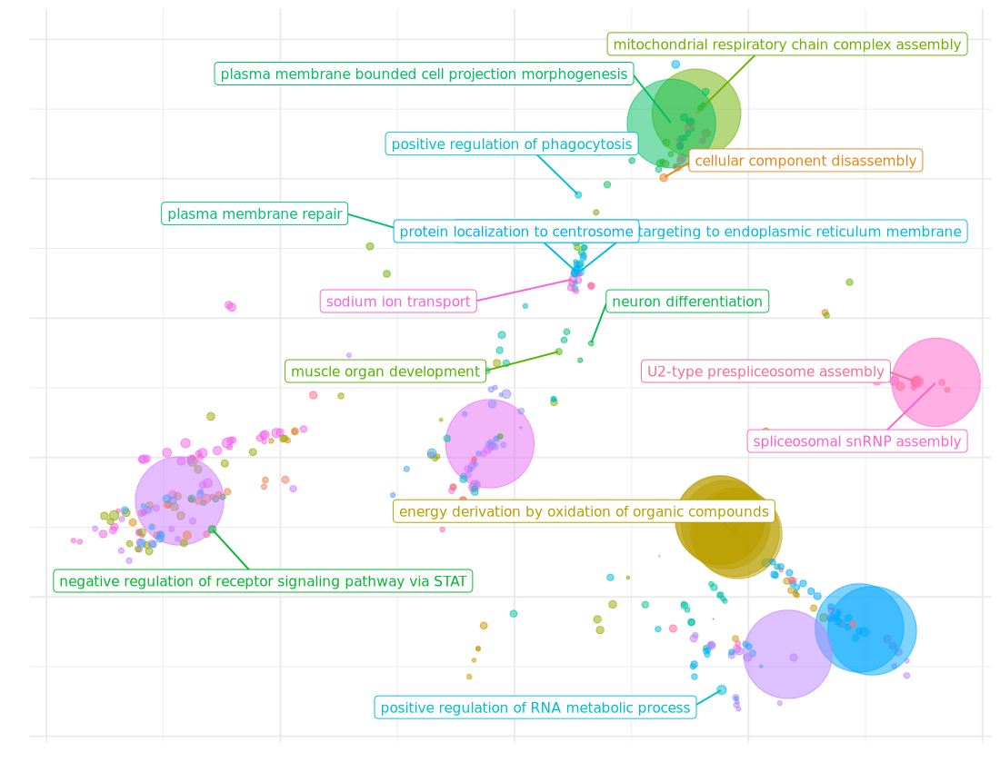

In [57]:
Image(os.path.join(os.getcwd(), "rrvgo_scatter.png"))


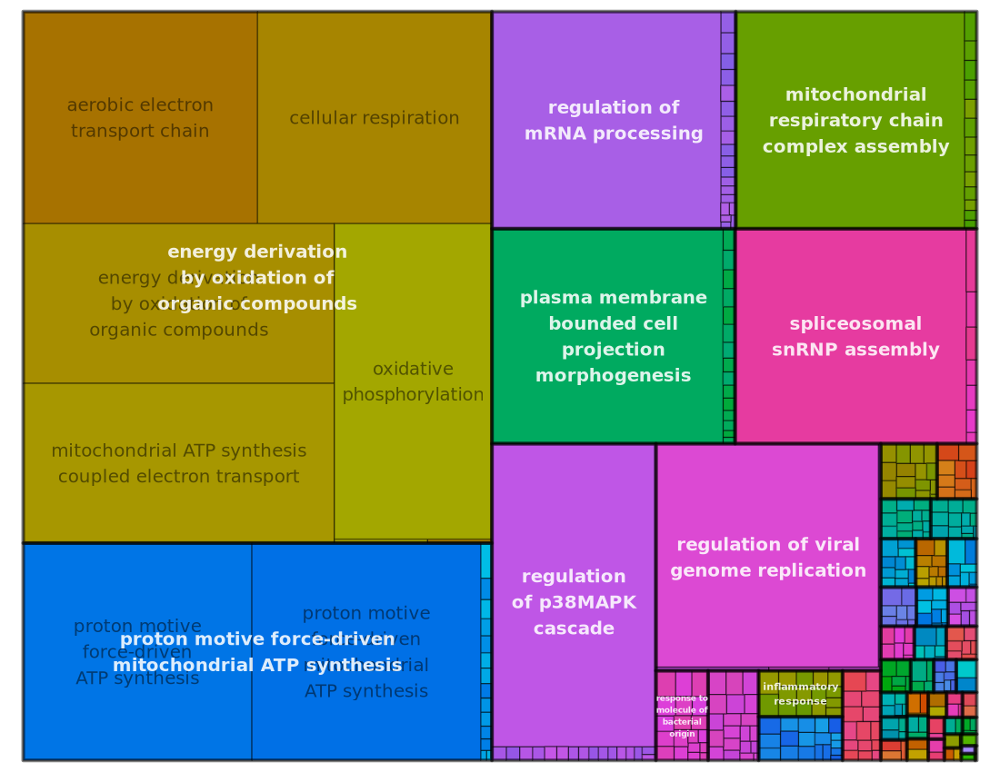

In [58]:
Image(os.path.join(os.getcwd(), "rrvgo_treemap.png"))


In [59]:
# # significant pathways for one panel:
# gsea_all[
#          (gsea_all["contrast"]  == "PD_vs_CTRL") &
#          (gsea_all["significant"])][["Term", "NES", "FDR q-val"]]

# # # or everything significant, across all panels:
# # gsea_all[gsea_all["significant"]].sort_values(["cell_type", "contrast", "FDR q-val"])

In [60]:
# ## trying with decoupler

# import decoupler as dc

# celltype = "Classical monocytes" 
# contrast = "PD_vs_CTRL" 

# stat = (
#     de_all[(de_all["cell_type"] == celltype) & (de_all["contrast"] == contrast)]
#     .dropna(subset=["stat"])
#     .drop_duplicates("gene")
#     .set_index("gene")
#     # sort by absolute Wald stat (your equivalent of "scores")
#     .sort_values("stat", key=np.abs, ascending=False)[["stat"]]
#     .rename_axis([f"{celltype} | {contrast}"], axis=1)
# )
# stat

In [61]:

# # 1. RANKING — one cell type + contrast, ALL tested genes (no HVG subset)
# sub = (de_all[(de_all["cell_type"] == "Classical monocytes") &
#               (de_all["contrast"]  == "PD_vs_CTRL")]
#        .dropna(subset=["stat"])
#        .drop_duplicates("gene"))

# # decoupler expects samples(=contrasts) × genes; one contrast = one row
# mat = sub.set_index("gene")[["stat"]].T
# mat.index = ["Classical monocytes | PD_vs_CTRL"]      # row label

# # 2. GENE SETS — REACTOME as long-format source/target
# #    reuse the same library you used for gseapy, converted to decoupler's format
# import gseapy as gp
# gmt = gp.get_library(name="Reactome_2022")            # {term: [genes]} (needs internet)
# net = pd.DataFrame(
#     [(term, g) for term, genes in gmt.items() for g in genes],
#     columns=["source", "target"]
# )

# # 3. RUN decoupler GSEA
# es, pval = dc.mt.gsea(mat, net, tmin=15)               # tmin = min genes per set
# # es  -> normalised enrichment scores (contrast × gene set)
# # pval -> permutation p-values